In [1]:
import os
import sys
from pathlib import Path
sys.path.append( '../src/')
import API
    
import utils.context_analysis as context_analysis

In [2]:
import glob
import time
import datetime
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import pandas as pd
import math
from time import time
from importlib import reload

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import NullFormatter
import matplotlib.colors as mcolors


from nptdms import TdmsFile

from collections import OrderedDict
from functools import partial
import warnings
warnings.filterwarnings("ignore")

from sklearn import manifold, datasets
from sklearn.manifold import TSNE
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.model_selection import ShuffleSplit
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN

# columns of Trend Data

'Timestamp', 
'Loadside_win', 
'Tubeside_win', 
'Collector', 
'Gun',
'IP_before_PC',
'PC_IP',
'WG_IP', 
'IP_Load', 
'IP_before_structure',
'US_Beam_Axis_IP', 
'Klystron_Flange_Temp', 
'Load_Temp',
'PC_Left_Cavity_Temp', 
'PC_Right_Cavity_Temp', 
'Bunker_WG_Temp',
'Structure_Input_Temp', 
'Chiller_1',
'Chiller_2',
'Chiller_3',
'PKI_FT_avg',
'PSI_FT_avg',
'PSR_FT_avg', 
'PEI_FT_avg', 
'PKI_max',
'PSI_max', 
'PSR_max', 
'PEI_max', 
'BLM_TIA_min', 
'BLM_min',
'DC_Down_min', 
'DC_Up_min', 
'BLM_TIA_Q', 
'PSI_Pulse_Width',
'Pulse_Count'

In [3]:
not_selected_features = [
    'Collector', 
    'Gun',
    'Klystron_Flange_Temp', 
    'Load_Temp',
    'PC_Left_Cavity_Temp', 
    'PC_Right_Cavity_Temp', 
    'Bunker_WG_Temp',
    'Structure_Input_Temp', 
    'PKI_FT_avg',
    'PSI_FT_avg',
    'PSR_FT_avg', 
    'PEI_FT_avg', 
    'PKI_max',
    'PSI_max', 
    'PSR_max', 
    'PEI_max', 
    'BLM_TIA_min', 
    'BLM_min',
    'BLM_TIA_Q', 
    'PSI_Pulse_Width',     
    'Chiller_1',
    'Chiller_2',
    'Chiller_3'
]
selected_features_to_load = [
    'Timestamp', 
    'Loadside_win', 
    'Tubeside_win', 
    'IP_before_PC',
    'PC_IP',
    'WG_IP', ###
    'IP_Load', 
    'IP_before_structure',
    'US_Beam_Axis_IP',
    'DC_Down_min', 
    'DC_Up_min', 
    'Pulse_Count'
]
selected_features_to_study = [
    'Loadside_win', 
    'IP_before_PC',
    'PC_IP',
    'WG_IP', ###
    'IP_Load', 
    'IP_before_structure',
    'US_Beam_Axis_IP',
    'DC_Down_min', 
    'DC_Up_min'
]
list_of_stable_operation_intervals = [
[int(1.8*1e8), int(2.125*1e8), -1],
[int(2.125*1e8), int(2.5*1e8), 1],
[int(2.5*1e8), int(2.88*1e8), -2],
[int(2.88*1e8), int(3.27*1e8), 2],
[int(3.27*1e8), int(3.55*1e8), -3],
[int(3.55*1e8), int(4.17*1e8), 3],
[int(4.17*1e8), int(4.18*1e8), -4],
[int(4.18*1e8), int(4.425*1e8), 4],
[int(4.425*1e8), int(4.5*1e8), -5],
[int(4.5*1e8), int(4.9*1e8), 5],
[int(4.9*1e8), int(5.05*1e8), -6],
[int(5.05*1e8), int(5.295*1e8), 6],
[int(5.295*1e8), int(5.475*1e8), -7],
[int(5.475*1e8), int(5.7125*1e8), 7],
[int(5.7125*1e8), int(5.8*1e8), -8],
[int(5.8*1e8), int(6.29*1e8), 8],
[int(6.29*1e8), int(6.35*1e8), -9],
[int(6.35*1e8), int(7*1e8), 9],
]

# 0. Import dataset

In [6]:
dataset_name = "CLIC_DATA_Xbox2_T24PSI_2"
df = pd.read_pickle(root_directory+'Xbox2_context_data.p.gz')
df.columns

Index(['BLM_TIA_Q', 'BLM_TIA_min', 'BLM_min', 'Bunker_WG_Temp', 'Chiller_1',
       'Chiller_2', 'Chiller_3', 'Collector', 'DC_Down__recomputed_D1',
       'DC_Down__recomputed_D9', 'DC_Down__recomputed_average',
       'DC_Down__recomputed_maximum', 'DC_Down__recomputed_median',
       'DC_Down__recomputed_minimum', 'DC_Down_min', 'DC_Up__recomputed_D1',
       'DC_Up__recomputed_D9', 'DC_Up__recomputed_average',
       'DC_Up__recomputed_maximum', 'DC_Up__recomputed_median',
       'DC_Up__recomputed_minimum', 'DC_Up_min', 'Gun', 'IP_Load',
       'IP_before_PC', 'IP_before_structure', 'Klystron_Flange_Temp',
       'Load_Temp', 'Loadside_win', 'PC_IP', 'PC_Left_Cavity_Temp',
       'PC_Right_Cavity_Temp', 'PEI_Amplitude__recomputed_amplitude',
       'PEI_Amplitude__recomputed_duration', 'PEI_FT_avg', 'PEI_max',
       'PKI_Amplitude__recomputed_amplitude',
       'PKI_Amplitude__recomputed_duration', 'PKI_FT_avg', 'PKI_max',
       'PSI_Amplitude__recomputed_amplitude',
       'PSI

In [7]:
list_of_timestamp_bd = list(df[df['label_CLIC']==0]['timestamp'].sort_values())
list_of_timestamp_bd.insert(0,datetime.datetime.strptime('2018-01-01 00:00:00.000000','%Y-%m-%d %H:%M:%S.%f'))
list_of_timestamp_bd.append(datetime.datetime.strptime('2019-01-01 00:00:00.000000','%Y-%m-%d %H:%M:%S.%f'))

In [8]:
list_of_files = glob.glob(root_directory+'CLIC_DATA_Xbox2_T24PSI_2___pickle_only_TrendData_2020-10-22/*')
list_of_files.sort()

lower_id_bd = 0
higher_id_bd = 0
lower_id_st = 0
higher_id_st = 0
tmp = []
for id_file, file in enumerate(list_of_files):
        
    if np.mod(id_file,10)==0:
        print(id_file)
    
    loc_tmp = pd.read_pickle(file)[selected_features_to_load]
    
    ###
    # compute the futur bd
    ###
    loc_tmp['fut_bd_timestamp__recomputed']=0
    
    first_Timestamp = loc_tmp.Timestamp.min()
    last_Timestamp = loc_tmp.Timestamp.max()
        
    while first_Timestamp > list_of_timestamp_bd[lower_id_bd+1]:          
        lower_id_bd+=1
    
    while last_Timestamp > list_of_timestamp_bd[higher_id_bd]:
        higher_id_bd+=1
        
    for i in range(lower_id_bd,higher_id_bd+1):
        loc_tmp.loc[loc_tmp['Timestamp'].between(list_of_timestamp_bd[i-1],list_of_timestamp_bd[i]),
                'fut_bd_timestamp__recomputed'
               ]=list_of_timestamp_bd[i]
    
    ###
    # compute the stable operation
    ###

    loc_tmp['stable_operation']=0
    
    for interval in list_of_stable_operation_intervals:
        loc_tmp.loc[loc_tmp['Pulse_Count'].between(interval[0],interval[1]),'stable_operation'] = interval[2]        

    tmp.append(loc_tmp.loc[loc_tmp.stable_operation>0])    
        

df_trenddata = pd.concat(tmp)

0
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170


In [9]:
df_trenddata.sort_values(by='Timestamp',inplace=True)

In [10]:
## testing the new fut_bd_timestamp vs old"
#df_test = pd.merge(df_trenddata,df, on="Timestamp")
#print(df_test[['fut_bd_timestamp','fut_bd_timestamp__recomputed']].iloc[1000:100000:10000])

In [11]:
# converting to second to better use this value
df_trenddata['time_to_fut_bd']= df_trenddata['fut_bd_timestamp__recomputed'].astype(np.datetime64) - df_trenddata['Timestamp']
df_trenddata['time_to_fut_bd']=df_trenddata['time_to_fut_bd'].dt.total_seconds()

In [12]:
print(df_trenddata.columns)
print(df_trenddata.shape)
print(df.columns)
print(df.shape)
print(len(list_of_timestamp_bd))

Index(['Timestamp', 'Loadside_win', 'Tubeside_win', 'IP_before_PC', 'PC_IP',
       'WG_IP', 'IP_Load', 'IP_before_structure', 'US_Beam_Axis_IP',
       'DC_Down_min', 'DC_Up_min', 'Pulse_Count',
       'fut_bd_timestamp__recomputed', 'stable_operation', 'time_to_fut_bd'],
      dtype='object')
(4533800, 15)
Index(['BLM_TIA_Q', 'BLM_TIA_min', 'BLM_min', 'Bunker_WG_Temp', 'Chiller_1',
       'Chiller_2', 'Chiller_3', 'Collector', 'DC_Down__recomputed_D1',
       'DC_Down__recomputed_D9', 'DC_Down__recomputed_average',
       'DC_Down__recomputed_maximum', 'DC_Down__recomputed_median',
       'DC_Down__recomputed_minimum', 'DC_Down_min', 'DC_Up__recomputed_D1',
       'DC_Up__recomputed_D9', 'DC_Up__recomputed_average',
       'DC_Up__recomputed_maximum', 'DC_Up__recomputed_median',
       'DC_Up__recomputed_minimum', 'DC_Up_min', 'Gun', 'IP_Load',
       'IP_before_PC', 'IP_before_structure', 'Klystron_Flange_Temp',
       'Load_Temp', 'Loadside_win', 'PC_IP', 'PC_Left_Cavity_Temp',
   

# 1. Study dt

In [13]:
#df_trenddata['dt']=df_trenddata['Timestamp'].diff().dt.total_seconds()

In [14]:
#plt.plot(df_trenddata['dt'],'.')
#plt.yscale('log')

# 2. Study nan in load

In [15]:
print("percentage of NaN 'during' stable operation")
print(sum(np.isnan(df_trenddata['Loadside_win']))/len(df_trenddata))
print(sum(np.isnan(df_trenddata['Tubeside_win']))/len(df_trenddata))
print(sum(np.logical_and(np.isnan(df_trenddata['Tubeside_win']),np.isnan(df_trenddata['Loadside_win'])))/len(df_trenddata))

percentage of NaN 'during' stable operation
0.06477656711809078
0.06477656711809078
0.06477656711809078


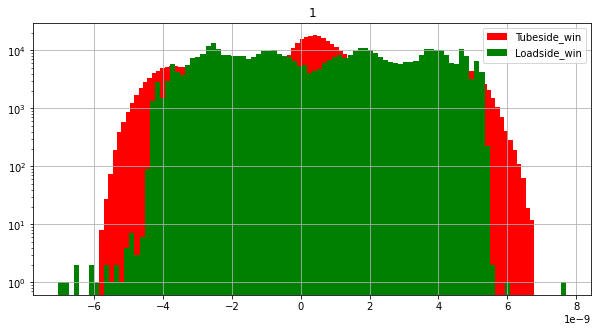

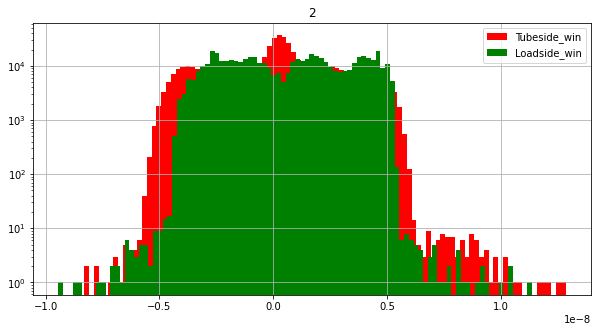

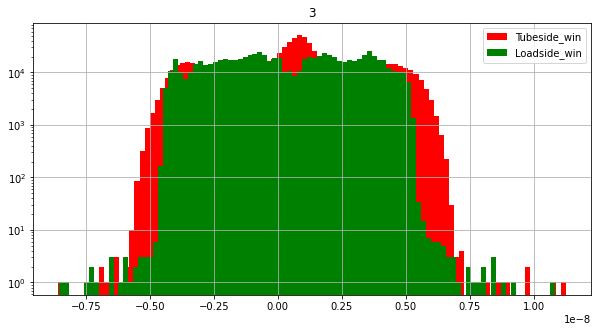

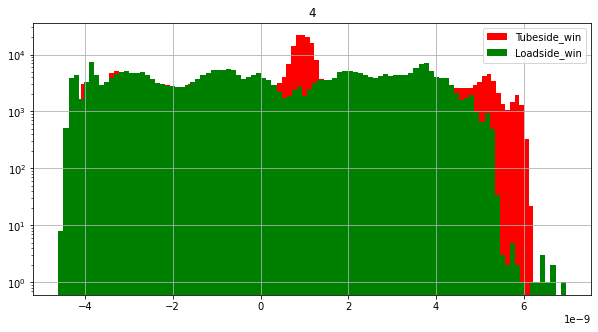

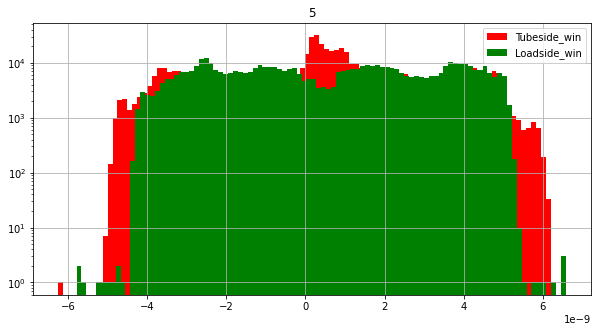

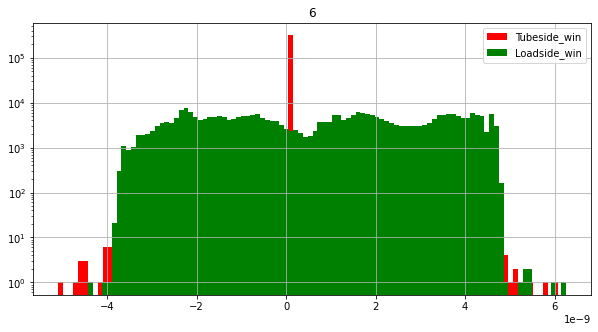

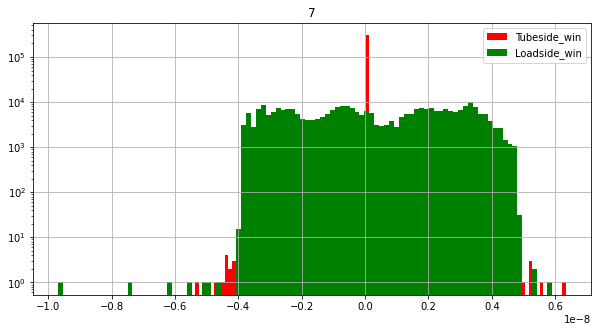

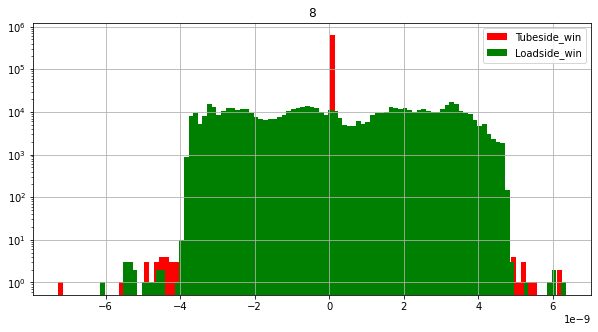

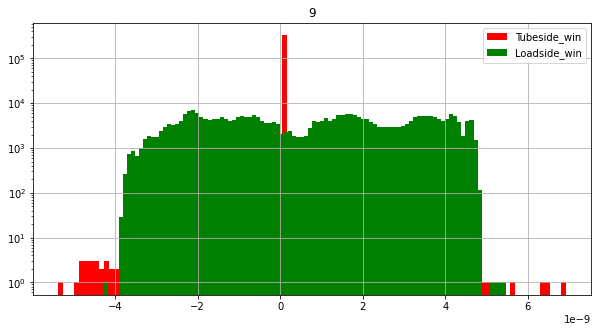

In [16]:
for stable_operation in range(1,10):
    plt.figure(figsize=(10,5))
    df_trenddata.loc[df_trenddata.stable_operation==stable_operation,'Tubeside_win'].hist(bins=100,color='r')
    df_trenddata.loc[df_trenddata.stable_operation==stable_operation,'Loadside_win'].hist(bins=100,color='g')
    plt.title(stable_operation)
    plt.yscale("log")
    plt.legend(['Tubeside_win','Loadside_win'])

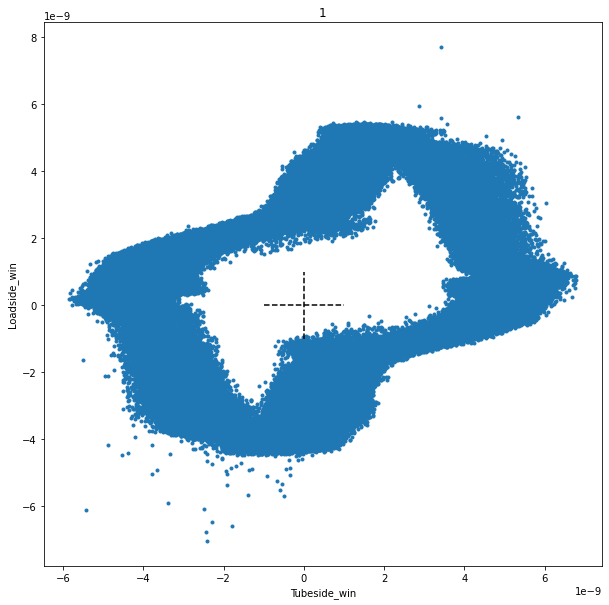

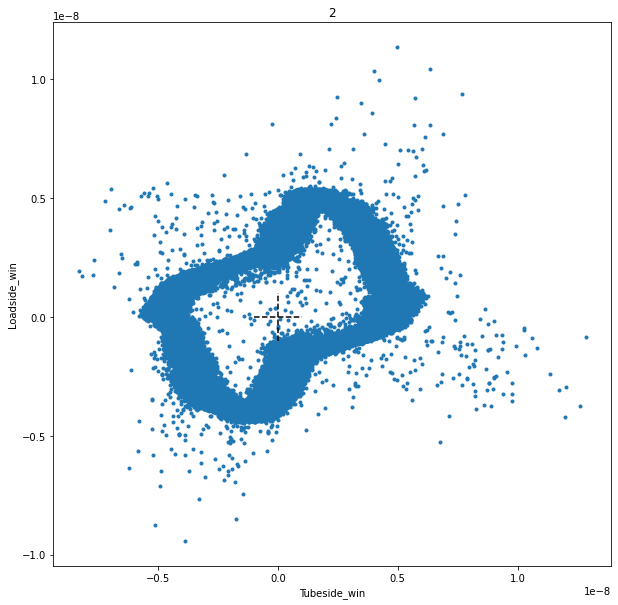

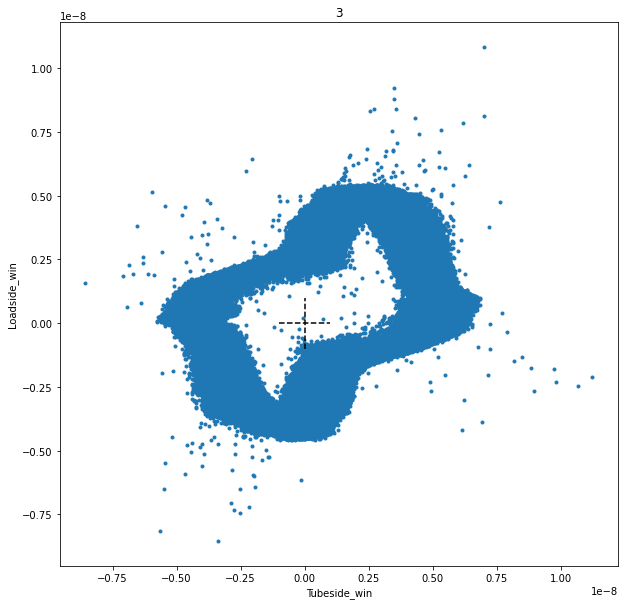

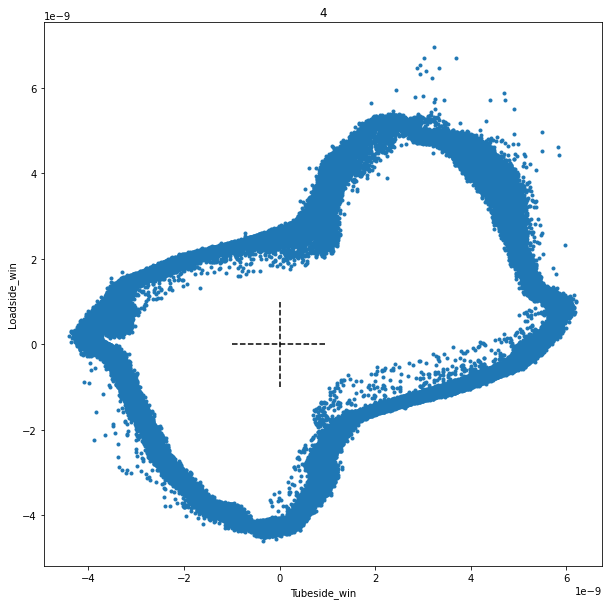

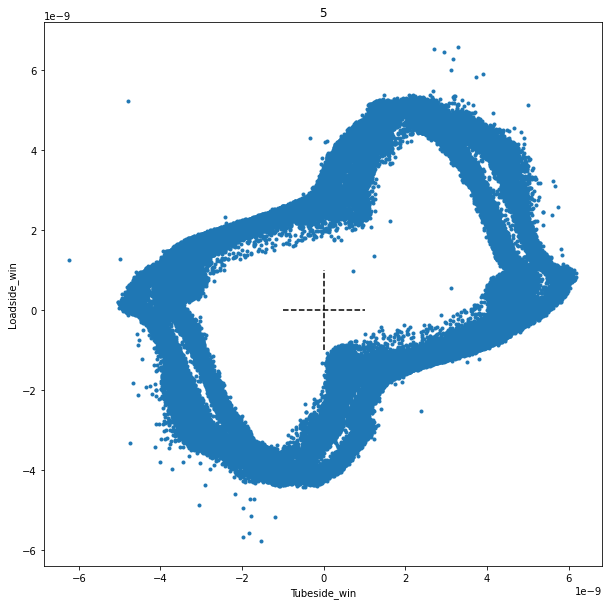

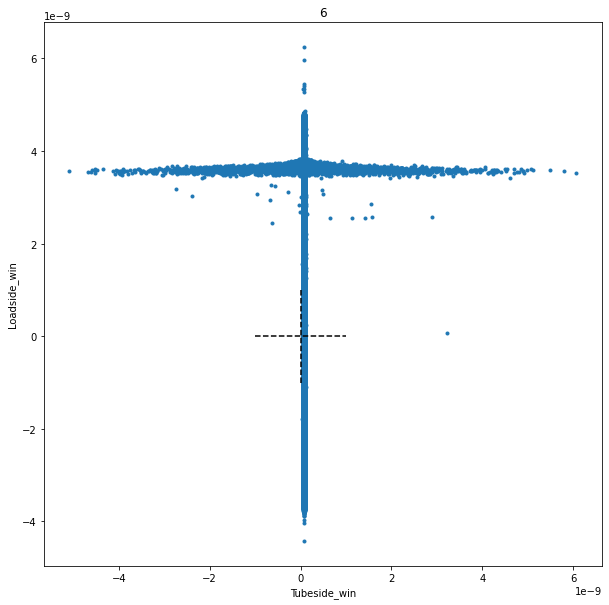

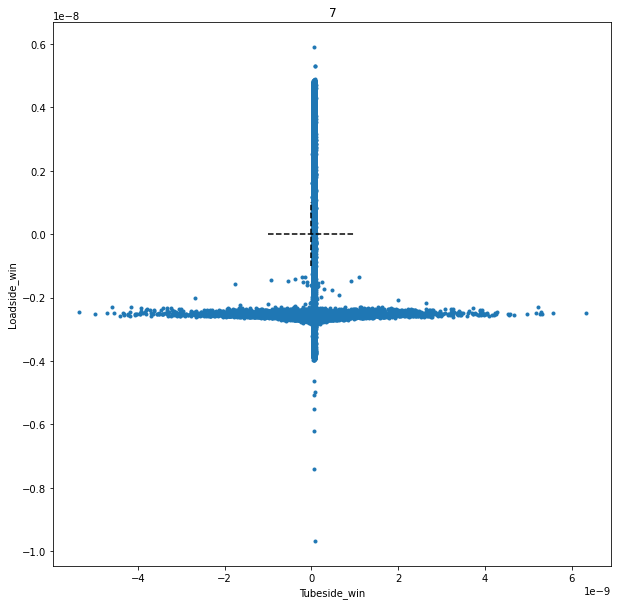

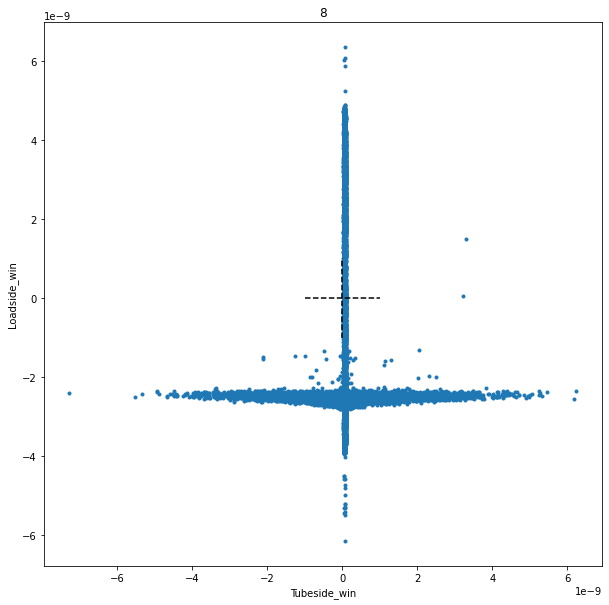

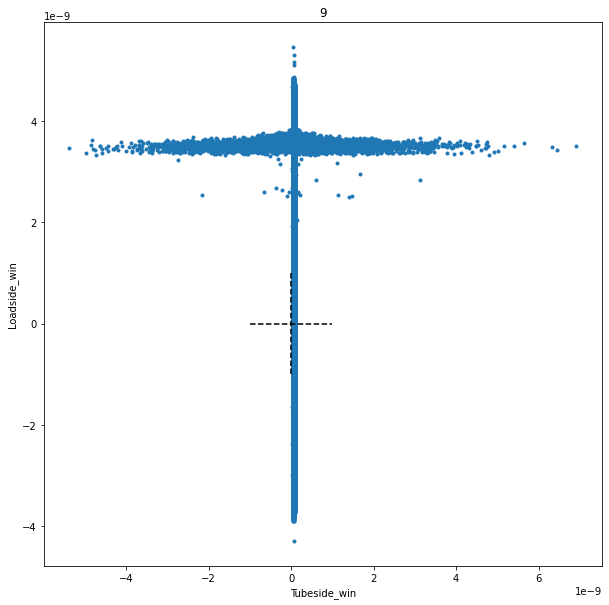

In [17]:
for stable_operation in range(1,10):
    plt.figure(figsize=(10,10))
    plt.plot(
        df_trenddata.loc[df_trenddata.stable_operation==stable_operation,'Tubeside_win'],
        df_trenddata.loc[df_trenddata.stable_operation==stable_operation,'Loadside_win'],
        '.')
#    plt.plot(
#        df_trenddata.loc[df_trenddata.stable_operation==stable_operation,'Tubeside_win'].iloc[0::100],
#        df_trenddata.loc[df_trenddata.stable_operation==stable_operation,'Loadside_win'].iloc[0::100],
#        'r.')
#    plt.plot(
#        df_trenddata.loc[df_trenddata.stable_operation==stable_operation,'Tubeside_win'].iloc[1::100],
#        df_trenddata.loc[df_trenddata.stable_operation==stable_operation,'Loadside_win'].iloc[1::100],
#        'g.')
    
    plt.plot([0,0],[-1e-9,1e-9],'--k')
    plt.plot([-1e-9,1e-9],[0,0],'--k')
    
    plt.title(stable_operation)
    plt.xlabel('Tubeside_win')
    plt.ylabel('Loadside_win')

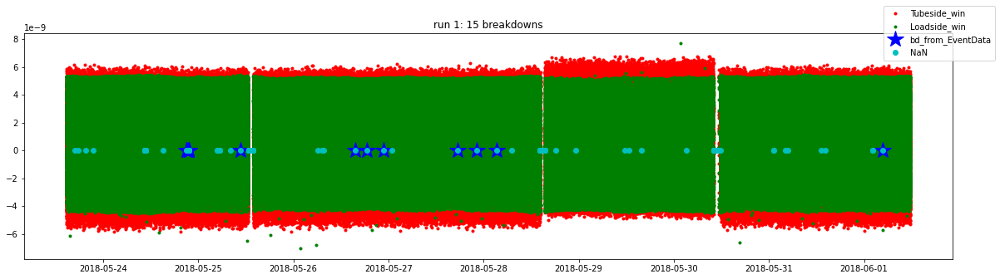

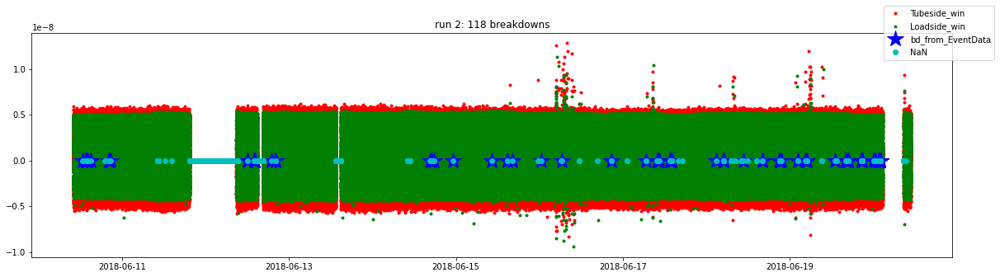

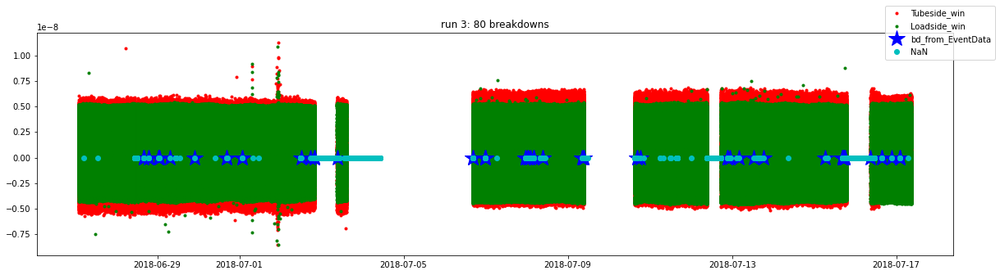

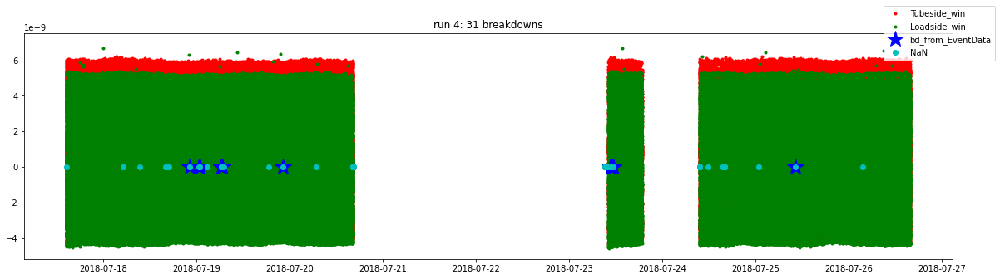

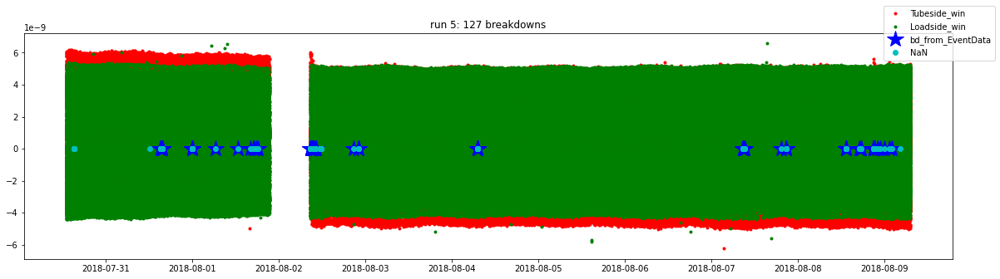

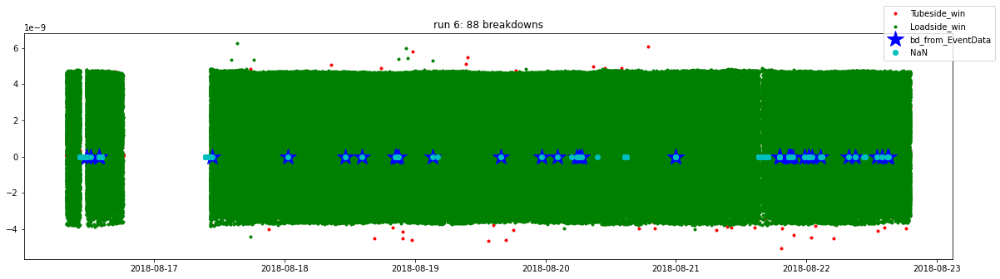

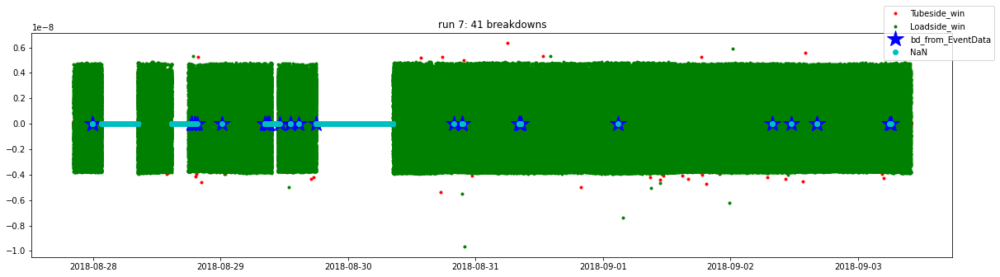

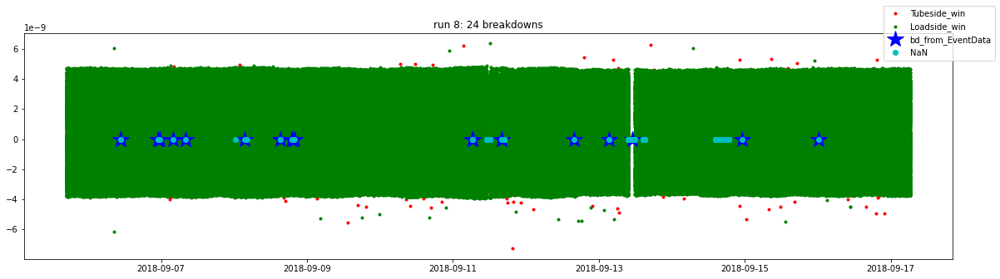

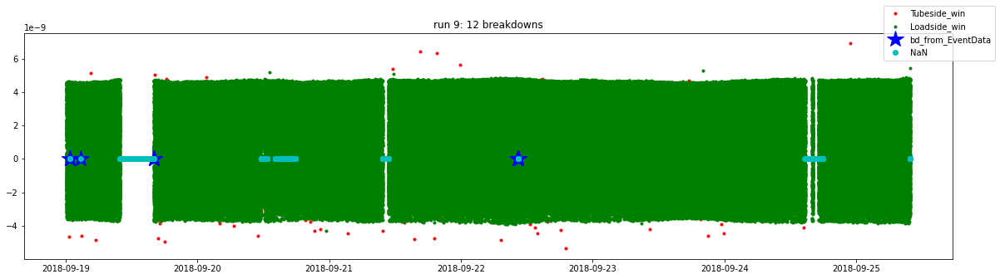

In [18]:
for stable_operation in range(1,10):

    plt.figure(figsize=(20,5))

    time = df_trenddata.loc[df_trenddata.stable_operation==stable_operation,'Timestamp']
    T = df_trenddata.loc[df_trenddata.stable_operation==stable_operation,'Tubeside_win']
    L = df_trenddata.loc[df_trenddata.stable_operation==stable_operation,'Loadside_win']
    
    plt.plot(time,
        T,
        '.r')
    plt.plot(time,
        L,
        '.g')  

    first_Timestamp = time.min()
    last_Timestamp = time.max()
    
    timestamp_to_plot = [timestamp_bd 
                         for timestamp_bd in list_of_timestamp_bd 
                         if (timestamp_bd >= first_Timestamp) and
                            (timestamp_bd <= last_Timestamp)]
    
    plt.plot(timestamp_to_plot,len(timestamp_to_plot)*[0],'*b',markersize=20)
    
    plt.plot(time.loc[np.isnan(T)],
             T.loc[np.isnan(T)].fillna(0),
             'oc')
    
    
    plt.legend(['Tubeside_win','Loadside_win','bd_from_EventData','NaN'],
               loc='center right',
               bbox_to_anchor=(1.05, 1))
    
    plt.title("run "+str(stable_operation)+": "+str(len(timestamp_to_plot))+" breakdowns")

In [19]:
for stable_operation in range(1,10):
    
    time = df_trenddata.loc[df_trenddata.stable_operation==stable_operation,'Timestamp']
    T = df_trenddata.loc[df_trenddata.stable_operation==stable_operation,'Tubeside_win']    

    time.reset_index(drop=True,inplace=True)
    T.reset_index(drop=True,inplace=True)
    nan_time = time.loc[np.isnan(T)]
        
    for v in nan_time:
        if np.shape(v)!=():
            print(np.shape(v))
        
    first_Timestamp = time.min()
    last_Timestamp = time.max()
    
    timestamp_to_plot = [timestamp_bd 
                         for timestamp_bd in list_of_timestamp_bd 
                         if (timestamp_bd >= first_Timestamp) and
                            (timestamp_bd <= last_Timestamp)]

    distance = np.zeros((3,len(timestamp_to_plot)))
    
    if True:
    
        print("***")
        print(stable_operation)

        for i in range(len(timestamp_to_plot)):

            print('---')        
            print(timestamp_to_plot[i])
            print('---')        

            dt = nan_time-timestamp_to_plot[i]
            dt_in_s = dt.dt.total_seconds()
            abs_dt_in_s = np.abs(dt_in_s)
            abs_dt_in_s_sorted = abs_dt_in_s.sort_values()
            n = 3
            list_of_index = abs_dt_in_s_sorted.index[:n].sort_values()
     
            for j in range(n):
                print(nan_time.loc[list_of_index[j]],"; dt =",dt_in_s.loc[list_of_index[j]])
                distance[j,i]=dt_in_s.loc[list_of_index[j]]

    #plt.figure(figsize=(20,5))
    #plt.imshow(np.log10(np.abs(distance)))
    #plt.colorbar()
    #plt.show()

***
1
---
2018-05-24 21:06:45.554221
---
2018-05-24 21:06:46.419825 ; dt = 0.865604
2018-05-24 21:07:06.219910 ; dt = 20.665689
2018-05-24 21:36:58.074773 ; dt = 1812.5205520000002
---
2018-05-24 21:07:05.466542
---
2018-05-24 21:06:46.419825 ; dt = -19.046717
2018-05-24 21:07:06.219910 ; dt = 0.753368
2018-05-24 21:36:58.074773 ; dt = 1792.6082310000002
---
2018-05-24 21:36:57.921953
---
2018-05-24 21:36:58.074773 ; dt = 0.15282
2018-05-24 21:36:59.766979 ; dt = 1.845026
2018-05-24 21:38:17.874774 ; dt = 79.952821
---
2018-05-24 21:38:17.621441
---
2018-05-24 21:38:17.874774 ; dt = 0.25333300000000003
2018-05-24 21:38:19.370866 ; dt = 1.749425
2018-05-24 21:38:27.166830 ; dt = 9.545389
---
2018-05-24 21:38:25.863231
---
2018-05-24 21:38:19.370866 ; dt = -6.492365
2018-05-24 21:38:27.166830 ; dt = 1.3035990000000002
2018-05-24 21:38:32.080893 ; dt = 6.217662000000001
---
2018-05-24 21:38:32.025415
---
2018-05-24 21:38:27.166830 ; dt = -4.858585000000001
2018-05-24 21:38:32.080893 ; dt 

2018-06-16 06:19:01.678359 ; dt = -157.26569800000001
2018-06-16 06:21:39.792768 ; dt = 0.8487110000000001
2018-06-16 11:30:01.842056 ; dt = 18502.897999
---
2018-06-16 20:46:18.434372
---
2018-06-16 16:40:02.526854 ; dt = -14775.907518000002
2018-06-16 20:46:18.607847 ; dt = 0.17347500000000002
2018-06-16 20:46:20.115468 ; dt = 1.6810960000000001
---
2018-06-17 06:43:37.083341
---
2018-06-17 06:43:37.126817 ; dt = 0.043476
2018-06-17 06:43:38.625701 ; dt = 1.5423600000000002
2018-06-17 09:49:00.823997 ; dt = 11123.740656
---
2018-06-17 10:07:14.841192
---
2018-06-17 10:07:14.940774 ; dt = 0.099582
2018-06-17 10:07:16.444835 ; dt = 1.6036430000000002
2018-06-17 10:07:22.745177 ; dt = 7.9039850000000005
---
2018-06-17 10:07:22.602930
---
2018-06-17 10:07:16.444835 ; dt = -6.158095
2018-06-17 10:07:22.745177 ; dt = 0.142247
2018-06-17 10:07:24.236800 ; dt = 1.6338700000000002
---
2018-06-17 10:07:52.533259
---
2018-06-17 10:07:22.745177 ; dt = -29.788082000000003
2018-06-17 10:07:24.2368

2018-06-20 01:56:05.890506 ; dt = -8.438183
2018-06-20 01:56:07.494524 ; dt = -6.8341650000000005
2018-06-20 01:56:15.392593 ; dt = 1.063904
---
2018-06-20 01:56:25.640660
---
2018-06-20 01:56:15.392593 ; dt = -10.248067
2018-06-20 01:56:26.588541 ; dt = 0.9478810000000001
2018-06-20 01:56:31.288723 ; dt = 5.6480630000000005
---
2018-06-20 01:56:30.397176
---
2018-06-20 01:56:26.588541 ; dt = -3.808635
2018-06-20 01:56:31.288723 ; dt = 0.8915470000000001
2018-06-20 01:56:43.986236 ; dt = 13.589060000000002
---
2018-06-20 01:56:42.665007
---
2018-06-20 01:56:26.588541 ; dt = -16.076466
2018-06-20 01:56:31.288723 ; dt = -11.376284
2018-06-20 01:56:43.986236 ; dt = 1.321229
---
2018-06-20 02:04:22.444975
---
2018-06-20 02:04:23.791467 ; dt = 1.346492
2018-06-20 02:05:05.007480 ; dt = 42.562505
2018-06-20 02:05:14.311689 ; dt = 51.866714
---
2018-06-20 02:05:04.326589
---
2018-06-20 02:04:23.791467 ; dt = -40.535122
2018-06-20 02:05:05.007480 ; dt = 0.680891
2018-06-20 02:05:14.311689 ; dt

2018-07-08 03:52:49.638909 ; dt = -95.46201400000001
2018-07-08 03:53:01.833048 ; dt = -83.267875
2018-07-08 03:54:26.244555 ; dt = 1.143632
---
2018-07-08 09:18:55.158913
---
2018-07-08 09:18:56.142607 ; dt = 0.9836940000000001
2018-07-08 09:20:02.736686 ; dt = 67.57777300000001
2018-07-08 09:20:04.328700 ; dt = 69.169787
---
2018-07-08 09:20:02.603313
---
2018-07-08 09:18:56.142607 ; dt = -66.460706
2018-07-08 09:20:02.736686 ; dt = 0.13337300000000002
2018-07-08 09:20:04.328700 ; dt = 1.725387
---
2018-07-09 08:33:54.642065
---
2018-07-09 08:33:54.767549 ; dt = 0.125484
2018-07-09 08:33:56.265548 ; dt = 1.623483
2018-07-09 08:34:03.971520 ; dt = 9.329455000000001
---
2018-07-09 08:34:02.724123
---
2018-07-09 08:33:54.767549 ; dt = -7.956574000000001
2018-07-09 08:33:56.265548 ; dt = -6.458575000000001
2018-07-09 08:34:03.971520 ; dt = 1.247397
---
2018-07-09 09:19:07.331055
---
2018-07-09 09:19:07.444580 ; dt = 0.113525
2018-07-09 09:19:08.938654 ; dt = 1.607599
2018-07-09 09:19:22.

2018-07-31 15:16:22.075891 ; dt = 0.593673
2018-07-31 15:16:26.685899 ; dt = 5.2036810000000004
2018-07-31 15:16:28.180258 ; dt = 6.698040000000001
---
2018-07-31 15:16:26.542560
---
2018-07-31 15:16:22.075891 ; dt = -4.4666690000000004
2018-07-31 15:16:26.685899 ; dt = 0.14333900000000002
2018-07-31 15:16:28.180258 ; dt = 1.637698
---
2018-07-31 15:16:32.963011
---
2018-07-31 15:16:28.180258 ; dt = -4.7827530000000005
2018-07-31 15:16:34.181261 ; dt = 1.21825
2018-07-31 15:16:38.886909 ; dt = 5.923898
---
2018-07-31 15:16:38.463168
---
2018-07-31 15:16:34.181261 ; dt = -4.281907
2018-07-31 15:16:38.886909 ; dt = 0.42374100000000003
2018-07-31 15:16:46.490842 ; dt = 8.027674000000001
---
2018-07-31 15:16:45.963312
---
2018-07-31 15:16:38.886909 ; dt = -7.076403
2018-07-31 15:16:46.490842 ; dt = 0.52753
2018-07-31 15:16:52.804472 ; dt = 6.84116
---
2018-07-31 15:16:52.803207
---
2018-07-31 15:16:46.490842 ; dt = -6.312365000000001
2018-07-31 15:16:52.804472 ; dt = 0.001265
2018-07-31 15

2018-08-02 09:20:21.475628 ; dt = 16.041261000000002
---
2018-08-02 09:20:21.411657
---
2018-08-02 09:20:04.767663 ; dt = -16.643994
2018-08-02 09:20:19.865613 ; dt = -1.5460440000000002
2018-08-02 09:20:21.475628 ; dt = 0.063971
---
2018-08-02 09:20:41.926981
---
2018-08-02 09:20:19.865613 ; dt = -22.061368
2018-08-02 09:20:21.475628 ; dt = -20.451353
2018-08-02 09:20:41.057535 ; dt = -0.869446
---
2018-08-02 09:22:39.008547
---
2018-08-02 09:22:37.463668 ; dt = -1.5448790000000001
2018-08-02 09:22:39.175600 ; dt = 0.167053
2018-08-02 09:22:55.675549 ; dt = 16.667002
---
2018-08-02 09:22:55.949997
---
2018-08-02 09:22:37.463668 ; dt = -18.486329
2018-08-02 09:22:39.175600 ; dt = -16.774397
2018-08-02 09:22:55.675549 ; dt = -0.274448
---
2018-08-02 09:40:52.155269
---
2018-08-02 09:40:50.890724 ; dt = -1.264545
2018-08-02 09:40:52.406577 ; dt = 0.25130800000000003
2018-08-02 09:46:26.910622 ; dt = 334.755353
---
2018-08-02 09:46:27.405117
---
2018-08-02 09:40:50.890724 ; dt = -336.5143

2018-08-16 11:36:40.667411 ; dt = -2459.393069
2018-08-16 11:36:42.067206 ; dt = -2457.993274
2018-08-16 12:17:41.330110 ; dt = 1.26963
---
2018-08-16 13:50:17.189713
---
2018-08-16 13:50:18.661261 ; dt = 1.471548
2018-08-16 13:50:23.492371 ; dt = 6.302658
2018-08-16 13:50:50.653542 ; dt = 33.463829000000004
---
2018-08-16 13:50:21.829759
---
2018-08-16 13:50:18.661261 ; dt = -3.168498
2018-08-16 13:50:23.492371 ; dt = 1.6626120000000002
2018-08-16 13:50:50.653542 ; dt = 28.823783000000002
---
2018-08-16 13:50:50.171411
---
2018-08-16 13:50:50.653542 ; dt = 0.48213100000000003
2018-08-16 13:51:04.057164 ; dt = 13.885753000000001
2018-08-16 13:51:11.757129 ; dt = 21.585718
---
2018-08-16 13:51:03.112378
---
2018-08-16 13:51:04.057164 ; dt = 0.944786
2018-08-16 13:51:11.757129 ; dt = 8.644751000000001
2018-08-16 13:51:13.365241 ; dt = 10.252863000000001
---
2018-08-16 13:51:11.591955
---
2018-08-16 13:51:04.057164 ; dt = -7.534791
2018-08-16 13:51:11.757129 ; dt = 0.16517400000000002
201

2018-08-21 21:01:48.584799 ; dt = -13.718801000000001
2018-08-21 21:01:54.674777 ; dt = -7.628823000000001
2018-08-21 21:02:03.776908 ; dt = 1.473308
---
2018-08-21 21:02:31.757022
---
2018-08-21 21:02:32.988894 ; dt = 1.231872
2018-08-21 21:02:38.984788 ; dt = 7.227766000000001
2018-08-21 21:02:40.495579 ; dt = 8.738557
---
2018-08-21 21:02:38.713993
---
2018-08-21 21:02:32.988894 ; dt = -5.725099
2018-08-21 21:02:38.984788 ; dt = 0.270795
2018-08-21 21:02:40.495579 ; dt = 1.7815860000000001
---
2018-08-21 21:05:11.947333
---
2018-08-21 21:05:12.378028 ; dt = 0.43069500000000005
2018-08-21 21:05:43.384804 ; dt = 31.437471000000002
2018-08-21 21:05:47.986678 ; dt = 36.039345000000004
---
2018-08-21 21:05:41.975141
---
2018-08-21 21:05:43.384804 ; dt = 1.409663
2018-08-21 21:05:47.986678 ; dt = 6.011537000000001
2018-08-21 21:05:49.478744 ; dt = 7.503603000000001
---
2018-08-21 21:05:47.883381
---
2018-08-21 21:05:43.384804 ; dt = -4.498577
2018-08-21 21:05:47.986678 ; dt = 0.103297
201

2018-08-31 08:12:27.152980 ; dt = -11.868101000000001
2018-08-31 08:12:40.052956 ; dt = 1.031875
2018-08-31 08:27:47.282980 ; dt = 908.2618990000001
---
2018-08-31 08:27:47.059424
---
2018-08-31 08:27:47.282980 ; dt = 0.223556
2018-08-31 08:27:48.768981 ; dt = 1.7095570000000002
2018-08-31 08:29:34.182955 ; dt = 107.123531
---
2018-08-31 08:29:33.499874
---
2018-08-31 08:27:47.282980 ; dt = -106.21689400000001
2018-08-31 08:27:48.768981 ; dt = -104.73089300000001
2018-08-31 08:29:34.182955 ; dt = 0.683081
---
2018-08-31 08:33:00.638010
---
2018-08-31 08:29:34.182955 ; dt = -206.45505500000002
2018-08-31 08:33:01.691055 ; dt = 1.053045
2018-08-31 08:33:10.881055 ; dt = 10.243045
---
2018-08-31 08:33:09.378330
---
2018-08-31 08:29:34.182955 ; dt = -215.195375
2018-08-31 08:33:01.691055 ; dt = -7.6872750000000005
2018-08-31 08:33:10.881055 ; dt = 1.502725
---
2018-09-01 02:45:51.616349
---
2018-08-31 08:33:01.691055 ; dt = -65569.925294
2018-08-31 08:33:10.881055 ; dt = -65560.735294
2018

In [20]:
if False:
    for stable_operation in range(1,10):
        plt.figure(figsize=(20,2))
        plt.plot(
            df_trenddata.loc[df_trenddata.stable_operation==stable_operation,'time_to_fut_bd'],
            df_trenddata.loc[df_trenddata.stable_operation==stable_operation,'Tubeside_win'].fillna(0),
            '.r')
        plt.plot(
            df_trenddata.loc[df_trenddata.stable_operation==stable_operation,'time_to_fut_bd'],
            df_trenddata.loc[df_trenddata.stable_operation==stable_operation,'Loadside_win'].fillna(0),
            '.g')
        x_tmp=df_trenddata.loc[df_trenddata.stable_operation==stable_operation,'time_to_fut_bd']
        y_tmp=df_trenddata.loc[df_trenddata.stable_operation==stable_operation,'Loadside_win']
        x = x_tmp.loc[np.isnan(y_tmp)]
        y = y_tmp.loc[np.isnan(y_tmp)].fillna(0)
        plt.plot(
            x,
            y,
            'k*')

        plt.xscale("log")
        plt.title(stable_operation)

# Old study

In [21]:
dataset_name = "CLIC_DATA_Xbox2_T24PSI_2"
df = pd.read_pickle(root_directory+'Xbox2_context_data.p.gz')
df.columns

Index(['BLM_TIA_Q', 'BLM_TIA_min', 'BLM_min', 'Bunker_WG_Temp', 'Chiller_1',
       'Chiller_2', 'Chiller_3', 'Collector', 'DC_Down__recomputed_D1',
       'DC_Down__recomputed_D9', 'DC_Down__recomputed_average',
       'DC_Down__recomputed_maximum', 'DC_Down__recomputed_median',
       'DC_Down__recomputed_minimum', 'DC_Down_min', 'DC_Up__recomputed_D1',
       'DC_Up__recomputed_D9', 'DC_Up__recomputed_average',
       'DC_Up__recomputed_maximum', 'DC_Up__recomputed_median',
       'DC_Up__recomputed_minimum', 'DC_Up_min', 'Gun', 'IP_Load',
       'IP_before_PC', 'IP_before_structure', 'Klystron_Flange_Temp',
       'Load_Temp', 'Loadside_win', 'PC_IP', 'PC_Left_Cavity_Temp',
       'PC_Right_Cavity_Temp', 'PEI_Amplitude__recomputed_amplitude',
       'PEI_Amplitude__recomputed_duration', 'PEI_FT_avg', 'PEI_max',
       'PKI_Amplitude__recomputed_amplitude',
       'PKI_Amplitude__recomputed_duration', 'PKI_FT_avg', 'PKI_max',
       'PSI_Amplitude__recomputed_amplitude',
       'PSI

In [33]:
def plot_IP_at_bd(delta,df_trenddata,df,normalisation=False):
    
    for run_studied in range(1,10):

        df_timestamp =  df[
                df['stable_operation']==run_studied][
                df['label_CLIC']==0]['timestamp']

        print("run ",run_studied,", # of bd = ",len(df_timestamp))

        fig = plt.figure(figsize=(16,16))

        for timestamp_bd in df_timestamp:
            tmp1 = df_trenddata[df_trenddata.Timestamp>(timestamp_bd-np.timedelta64(delta, 's'))]
            tmp2 = tmp1[tmp1.Timestamp<(timestamp_bd+np.timedelta64(delta, 's'))]                                
            
            dt = -np.timedelta64(1, 's')
            first_point = -1
            while dt<np.timedelta64(0, 's'):
                first_point +=1
                isnan=np.isnan(tmp2['Loadside_win'][first_point:])
                argmax=np.argmax(isnan)+first_point
                timestamp_NaN =  tmp2['Timestamp'].iloc[argmax]
                dt = timestamp_NaN - timestamp_bd
                #print(dt,first_point,timestamp_bd,timestamp_NaN)
  
            if False:
                print("***")
                print(isnan)
                print(argmax)
                print(timestamp_NaN)
            
            for id_origin,timestamp in enumerate([timestamp_bd,timestamp_NaN]):
                
                temps = tmp2['Timestamp']-timestamp

                for id_y,y in enumerate([
                    'IP_before_structure',
                    'US_Beam_Axis_IP',
                ]):                
                    
                    ax = fig.add_subplot(2, 2, 1+id_y+id_origin*2)
                    
                    plt.title("run ="+str(run_studied))
                        
                        
                    if normalisation:
                        plt.plot(temps,tmp2[y]/tmp2[y].iloc[0],'o-')
                        ymin = 1e-3
                        ymax = 1e3
                    else:
                        plt.plot(temps,tmp2[y],'o-')
                        ymin = 1e-12
                        ymax = 1e-6
                    xlim=[0,0]
                    ylim=[ymin,ymax]
                    plt.plot(xlim,ylim,'w-',linewidth=2)
                    plt.plot(xlim,ylim,'k--')
                    plt.yscale("log")                
                    plt.xlim([-delta*1.1*10**9,delta*1.1*10**9])
                                                        
                    if id_origin == 0:
                        plt.ylabel(y+" bd centered")# [normalized to the first point]")
                    elif id_origin == 1:
                        plt.ylabel(y+" NaN centered")# [normalized to the first point]")
                        
                    

            
        plt.show()

run  1 , # of bd =  15


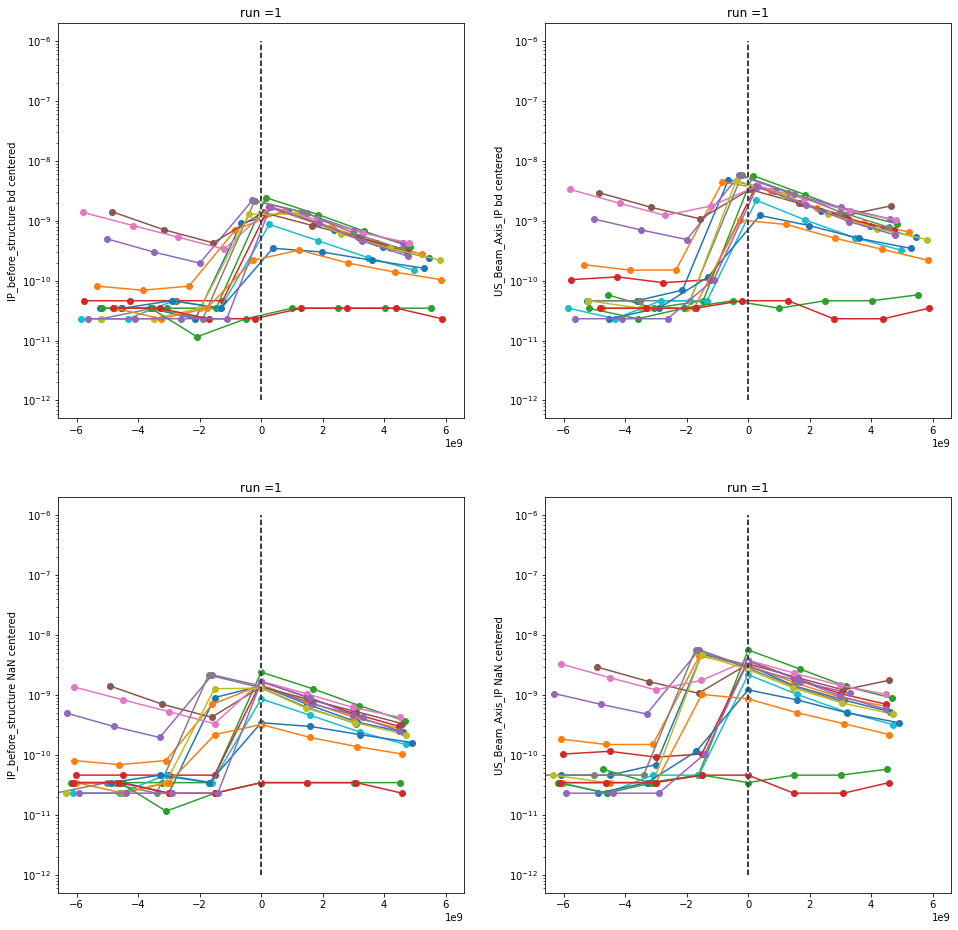

run  2 , # of bd =  118


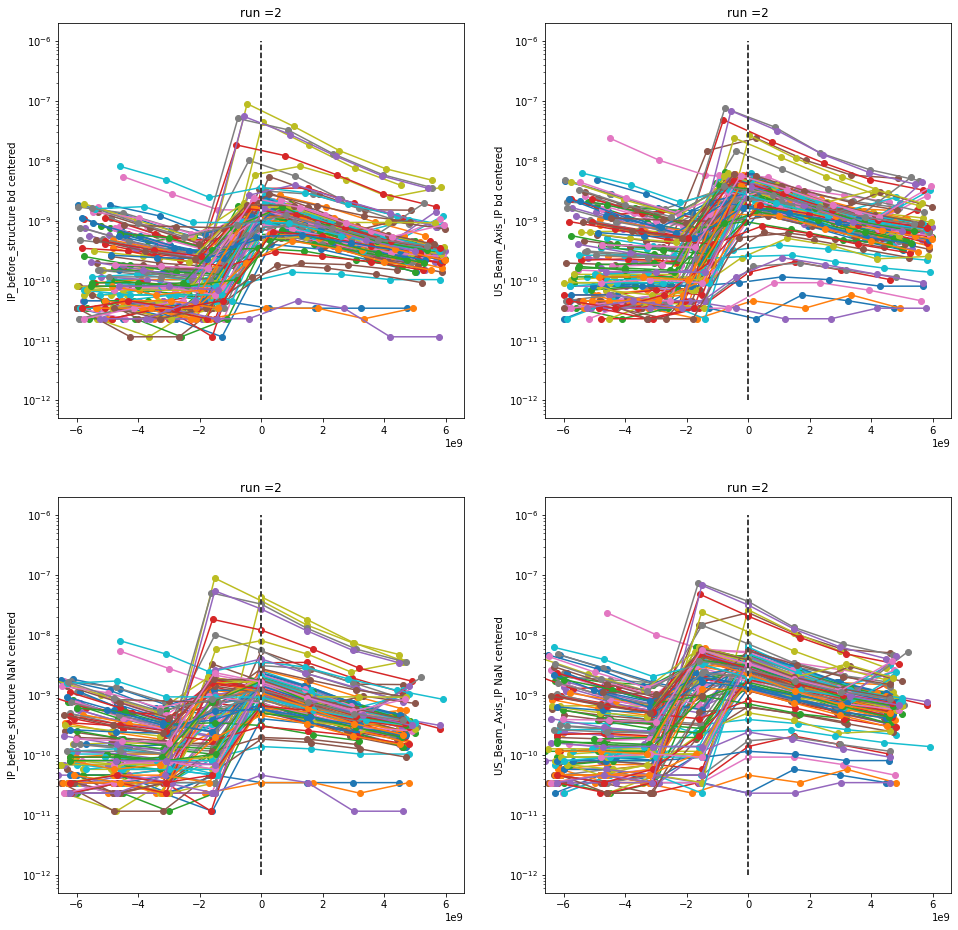

run  3 , # of bd =  80


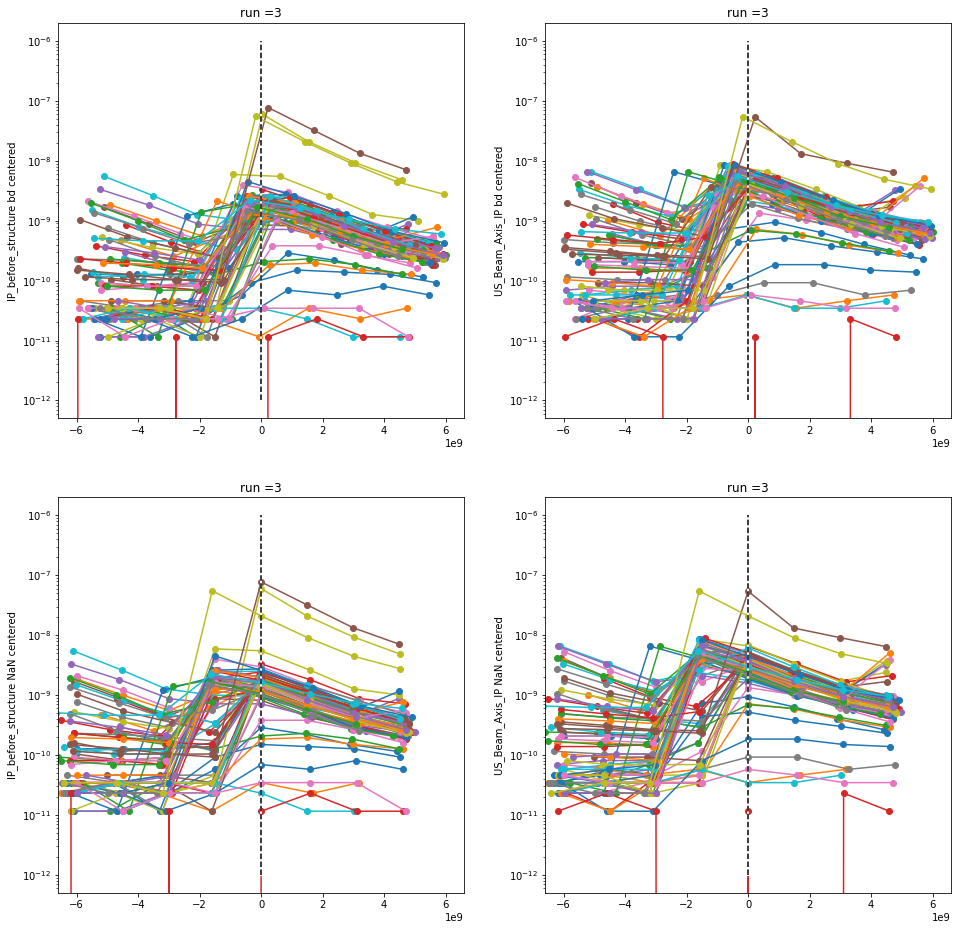

run  4 , # of bd =  31


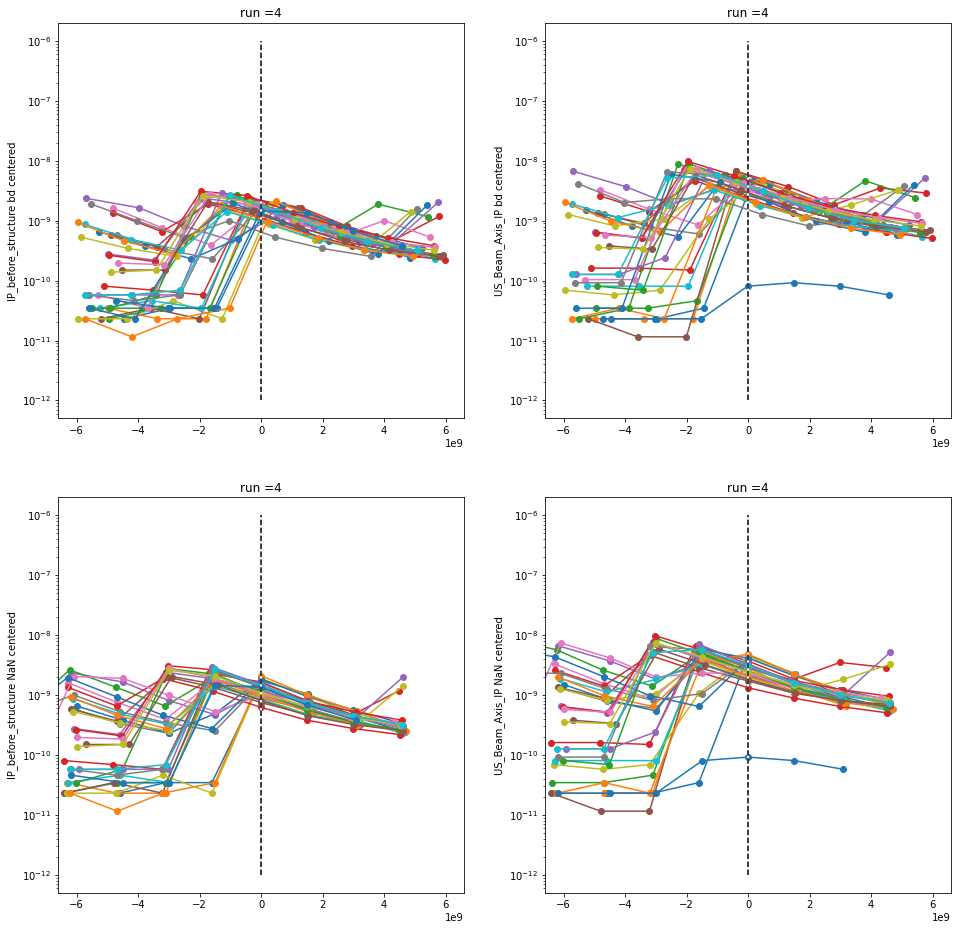

run  5 , # of bd =  127


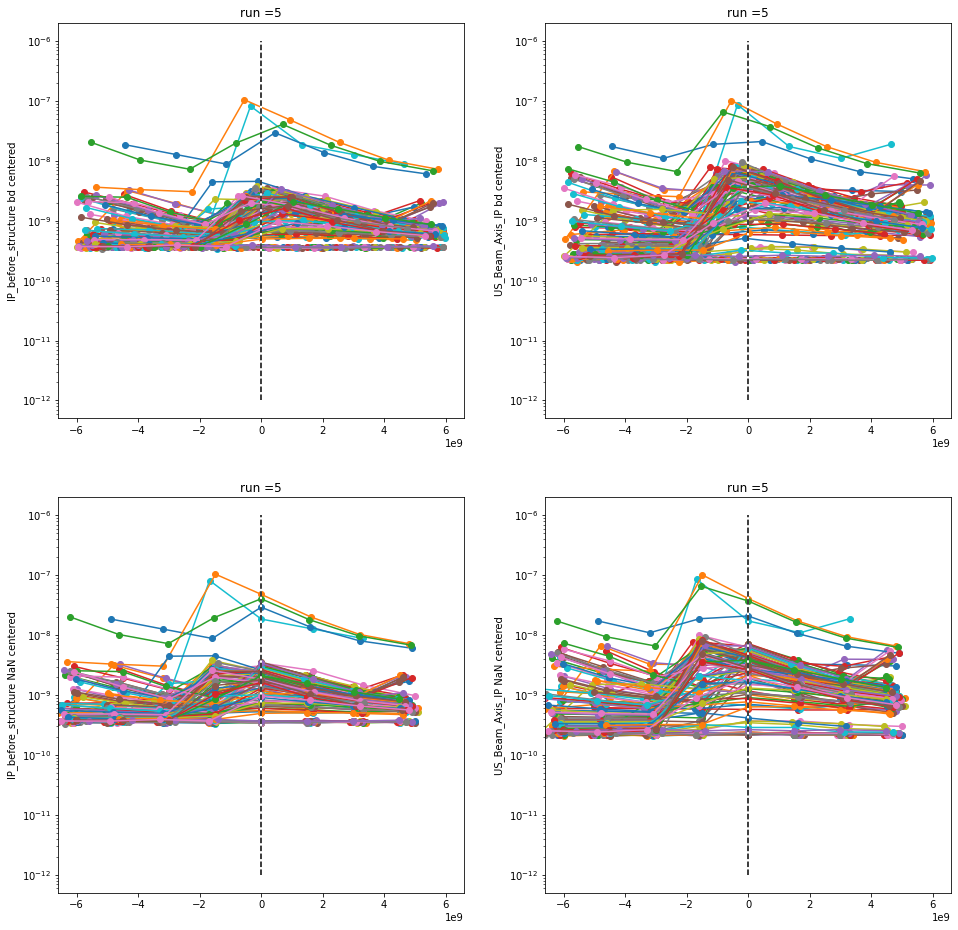

run  6 , # of bd =  88


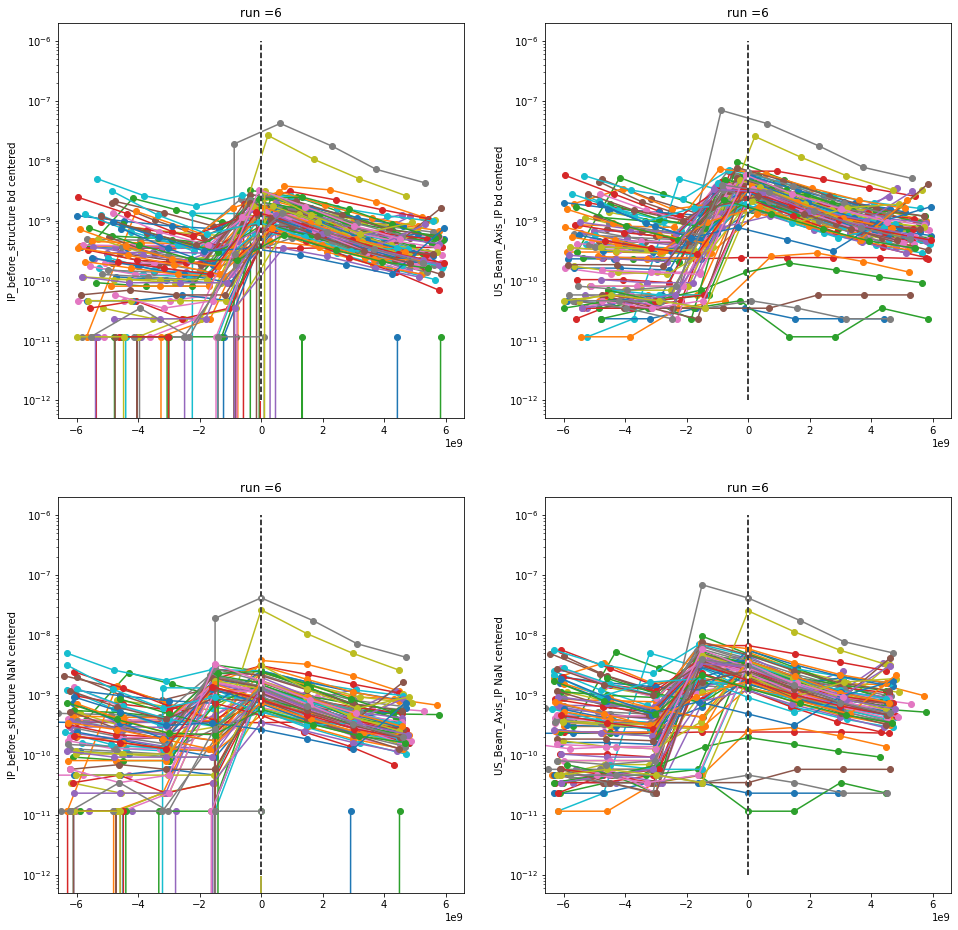

run  7 , # of bd =  41


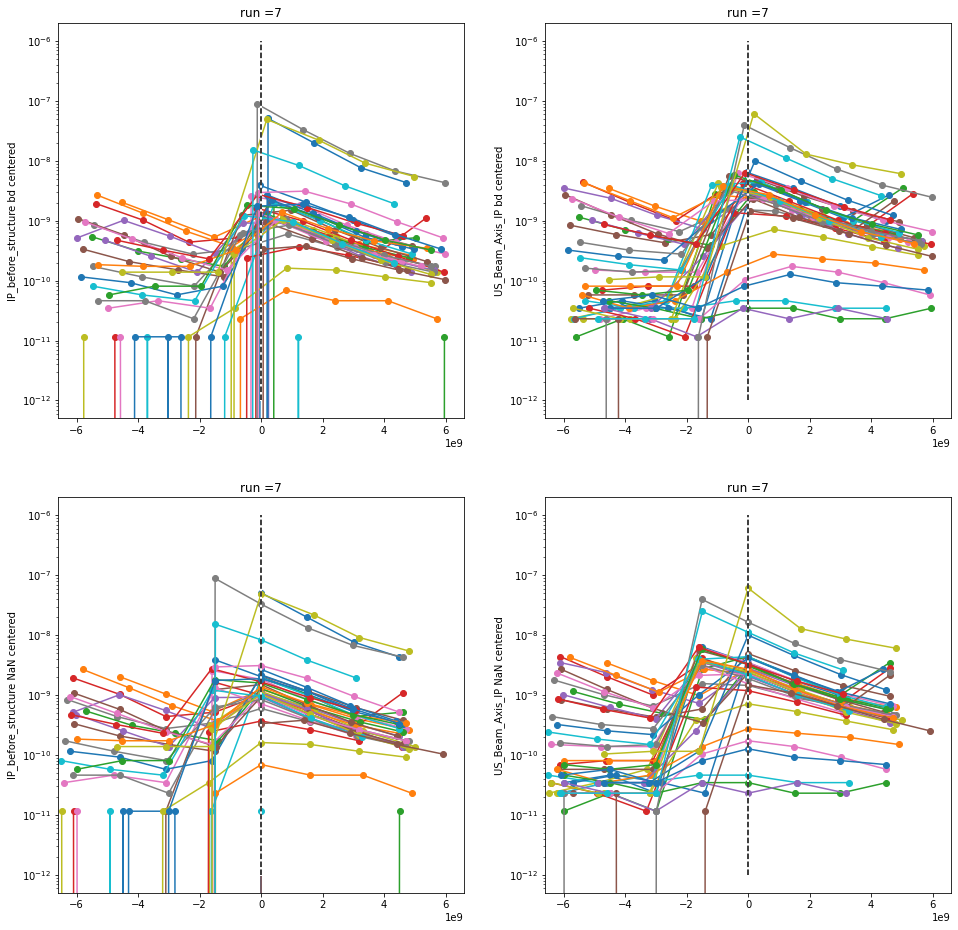

run  8 , # of bd =  24


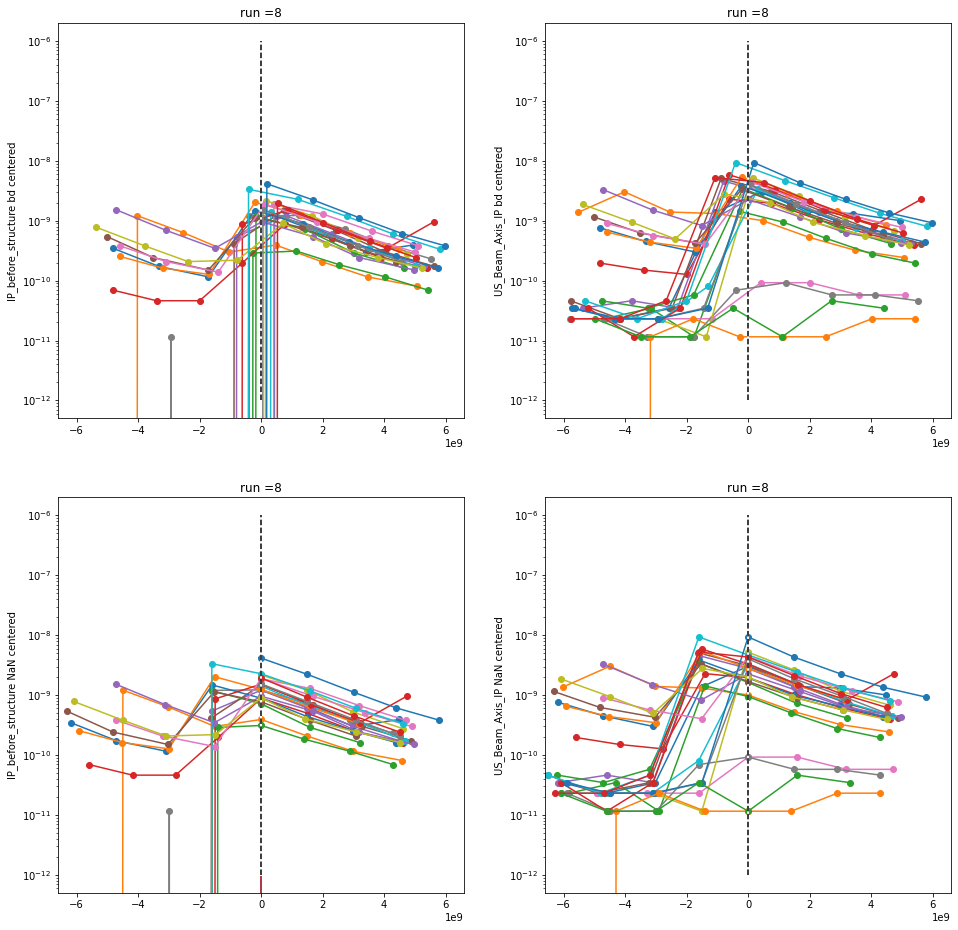

run  9 , # of bd =  12


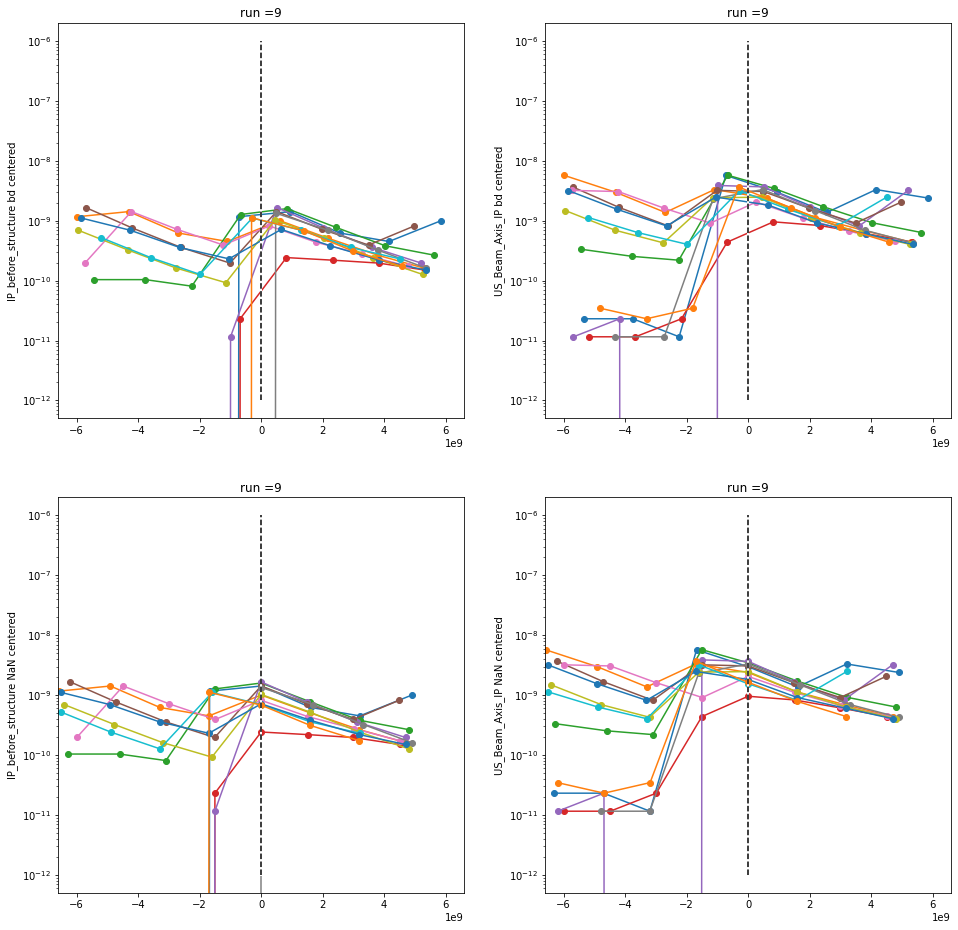

In [31]:
plot_IP_at_bd(6,df_trenddata,df,False)

run  1 , # of bd =  15


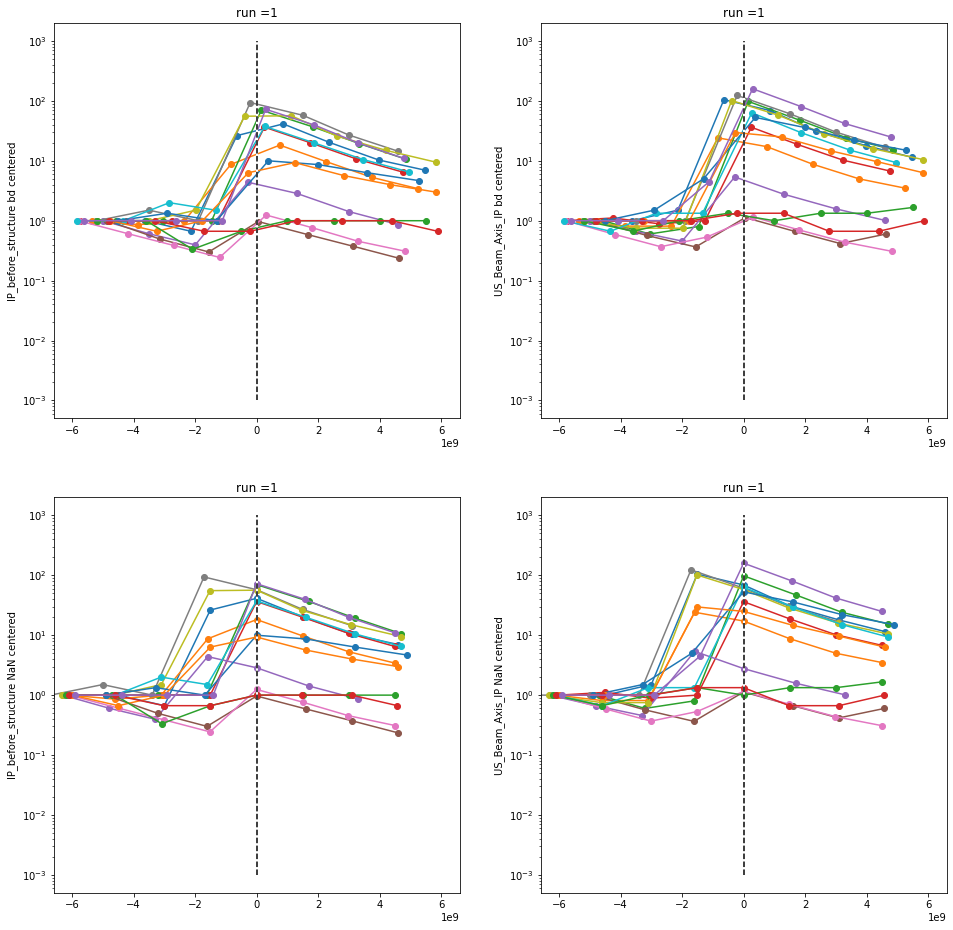

run  2 , # of bd =  118


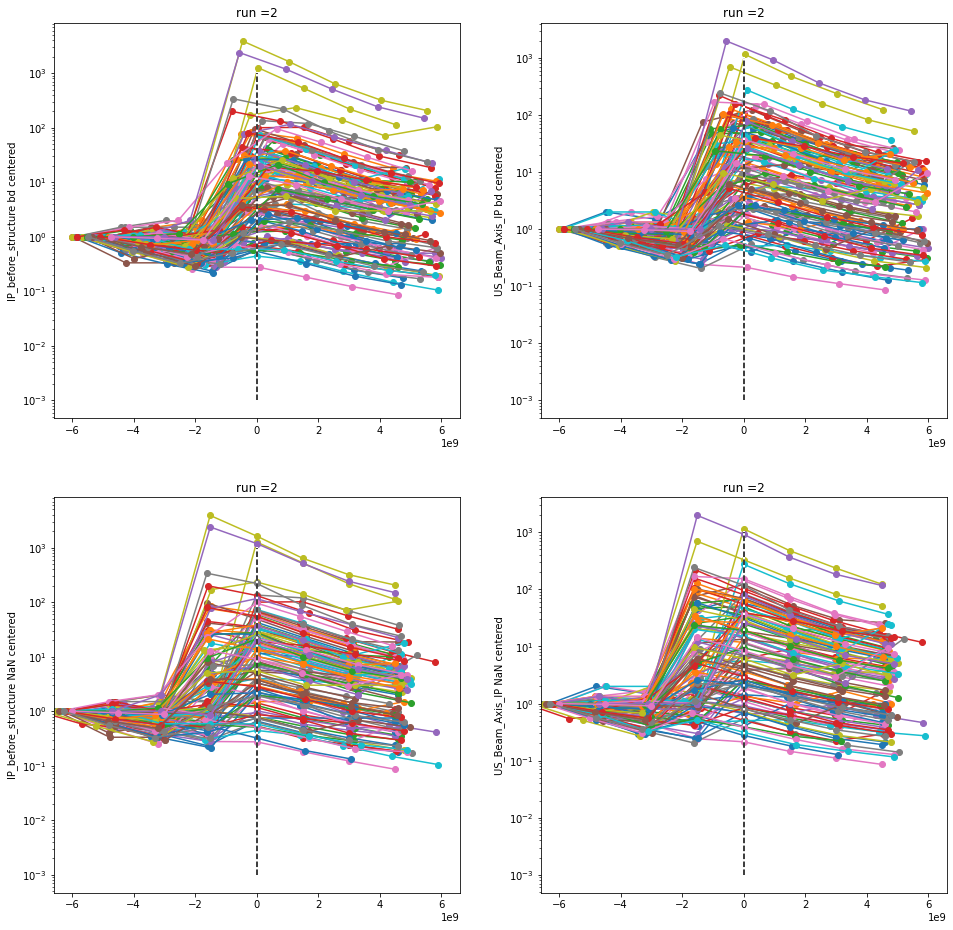

run  3 , # of bd =  80


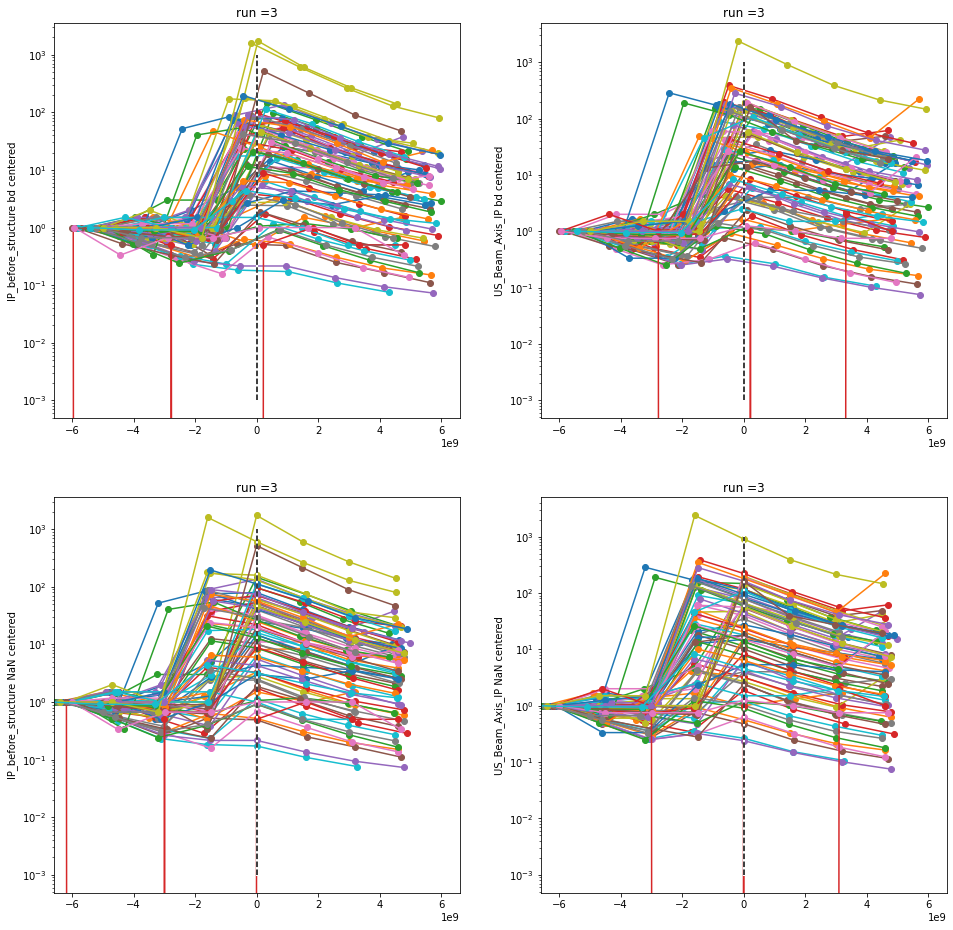

run  4 , # of bd =  31


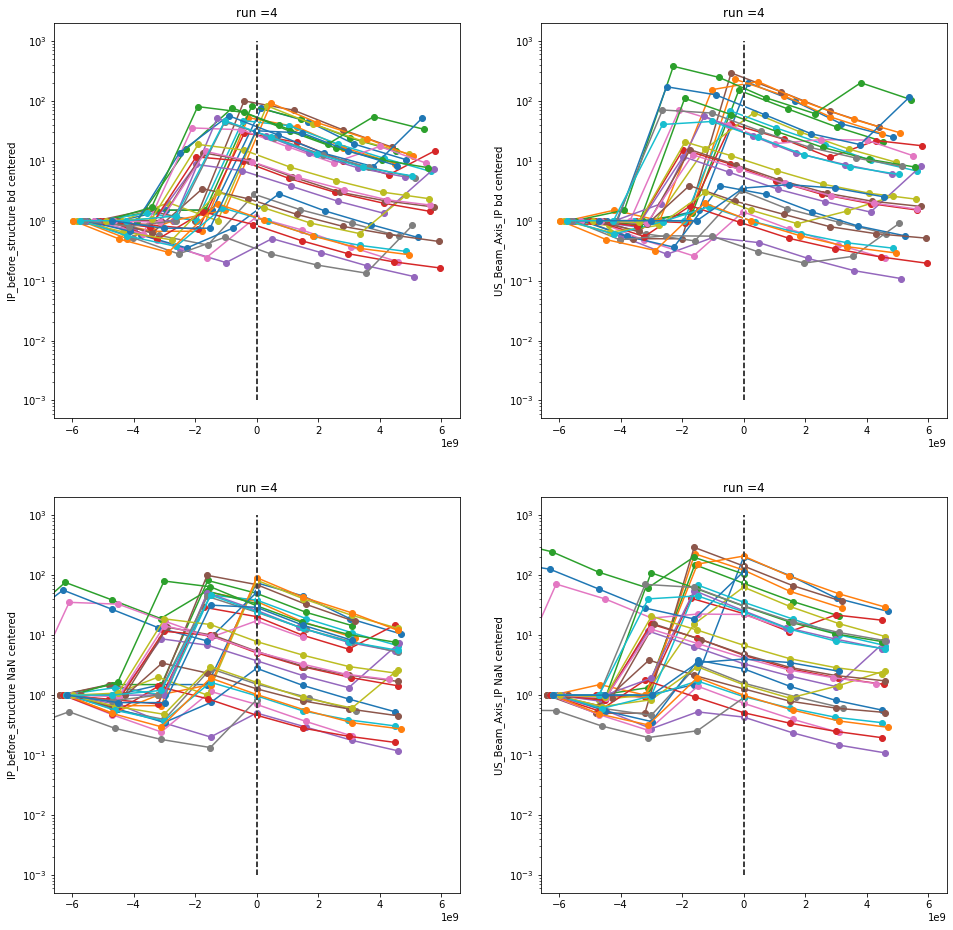

run  5 , # of bd =  127


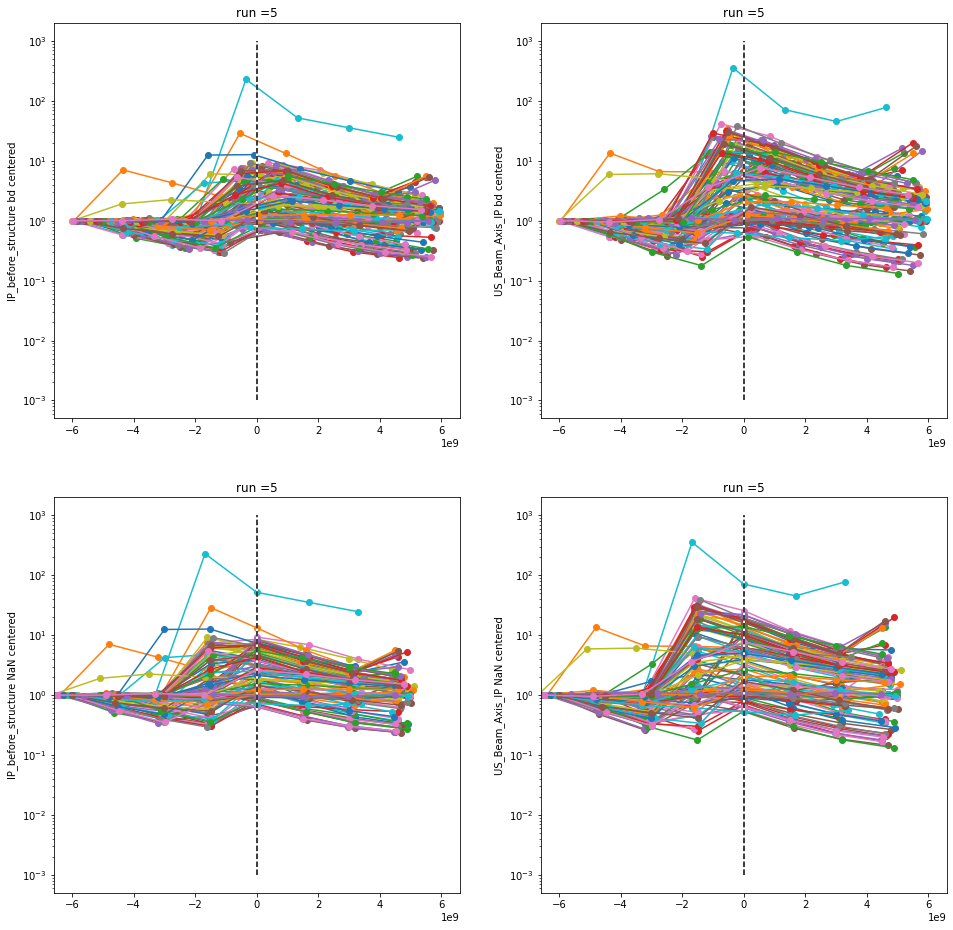

run  6 , # of bd =  88


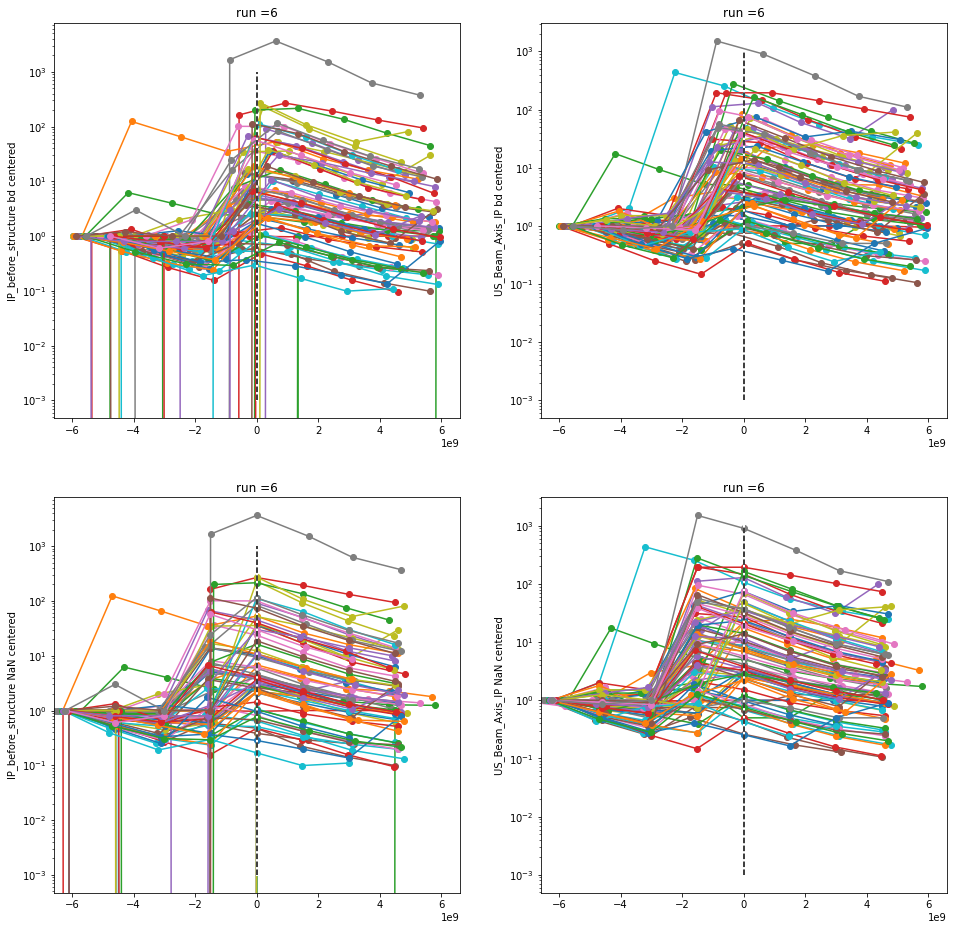

run  7 , # of bd =  41


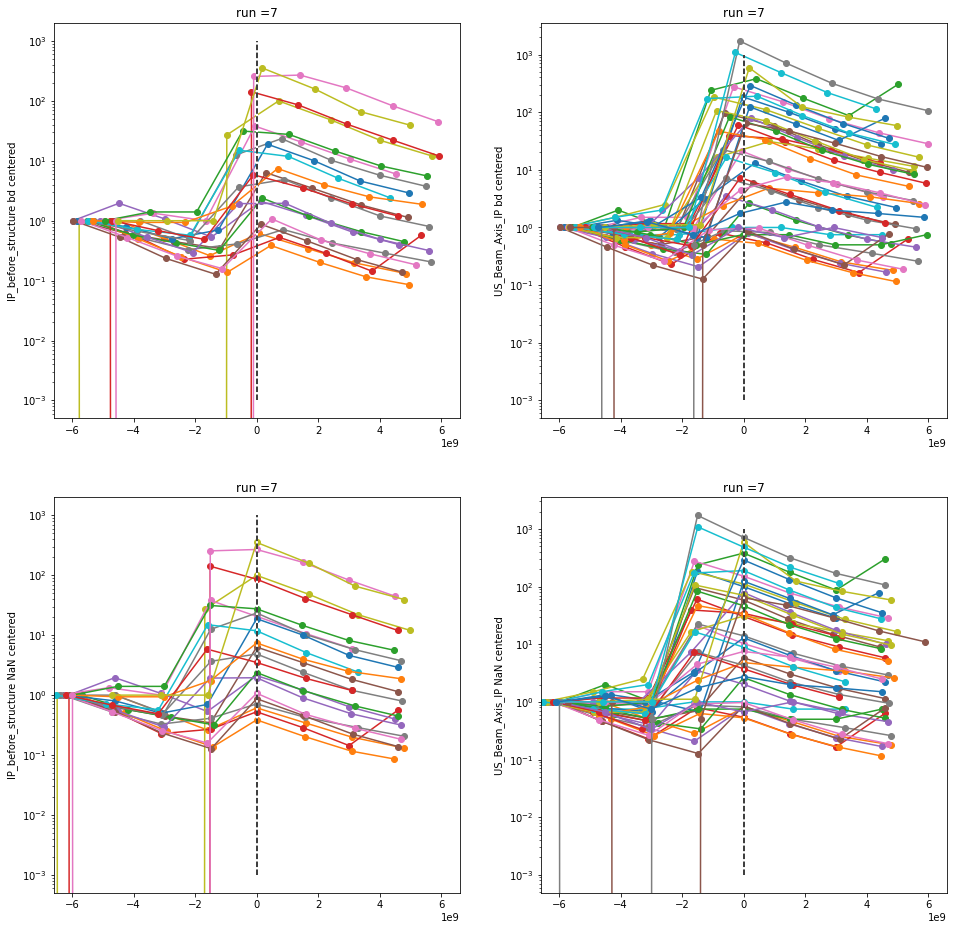

run  8 , # of bd =  24


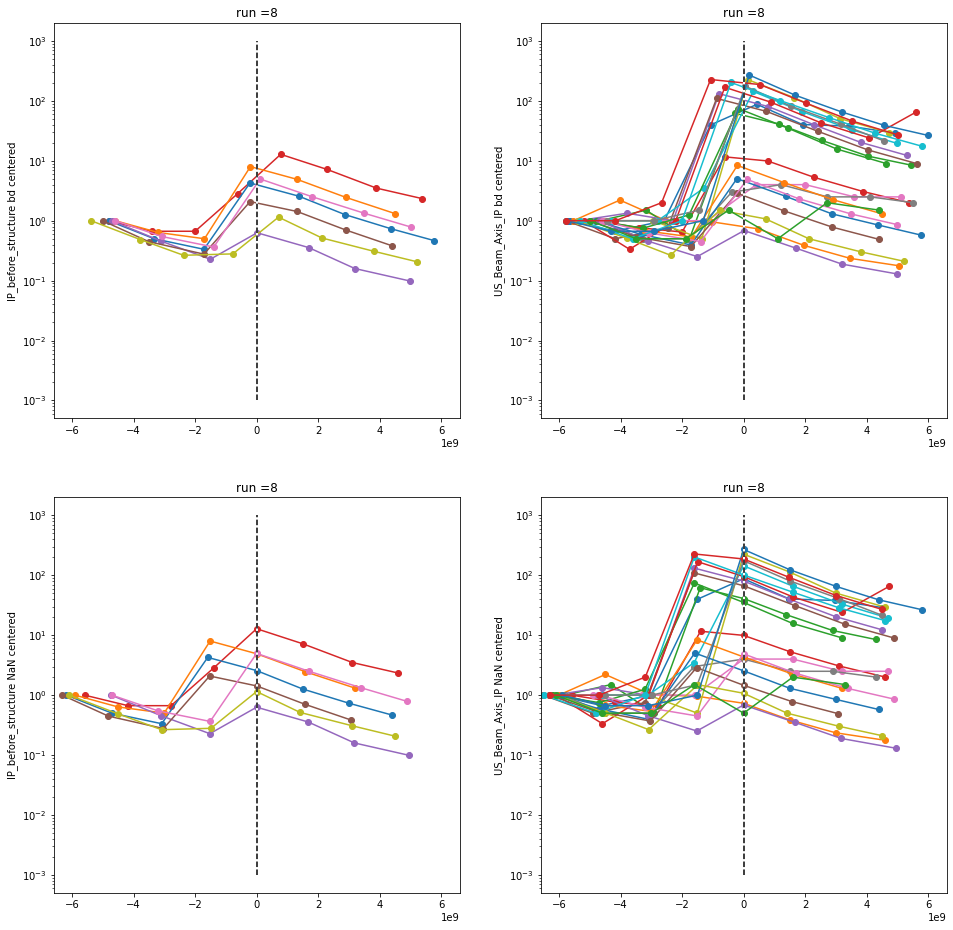

run  9 , # of bd =  12


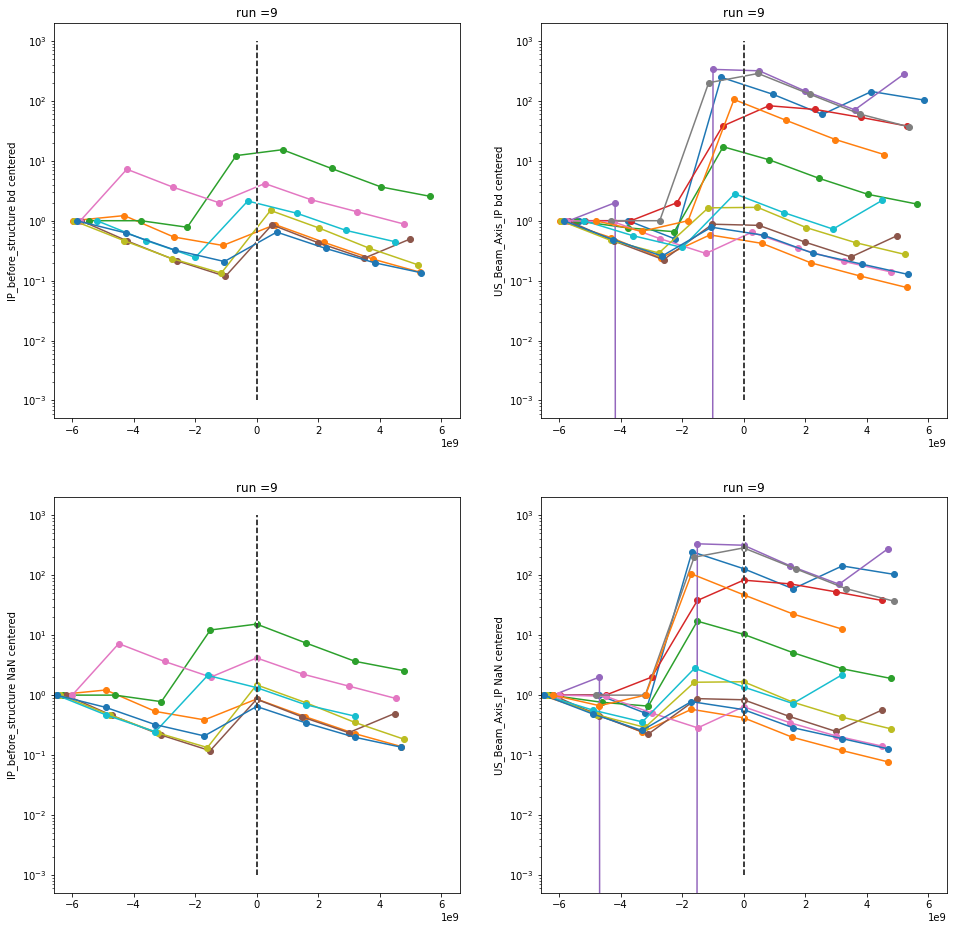

In [34]:
plot_IP_at_bd(6,df_trenddata,df,True)

In [41]:
def plot_feature_at_bd(delta,df_trenddata,df):
    
    for run_studied in range(1,10):

        df_timestamp =  df[
                df['stable_operation']==run_studied][
                df['label_CLIC']==0]['timestamp']

        print("run ",run_studied,", # of bd = ",len(df_timestamp))

        fig = plt.figure(figsize=(18,8))

        for timestamp_bd in df_timestamp:
            tmp1 = df_trenddata[df_trenddata.Timestamp>(timestamp_bd-np.timedelta64(delta, 's'))]
            tmp2 = tmp1[tmp1.Timestamp<(timestamp_bd+np.timedelta64(delta, 's'))]                                
            
            dt = -np.timedelta64(1, 's')
            first_point = -1
            while dt<np.timedelta64(0, 's'):
                first_point +=1
                isnan=np.isnan(tmp2['Loadside_win'][first_point:])
                argmax=np.argmax(isnan)+first_point
                timestamp_NaN =  tmp2['Timestamp'].iloc[argmax]
                dt = timestamp_NaN - timestamp_bd
                #print(dt,first_point,timestamp_bd,timestamp_NaN)
  
            if False:
                print("***")
                print(isnan)
                print(argmax)
                print(timestamp_NaN)
            
            for id_origin,timestamp in enumerate([timestamp_bd,timestamp_NaN]):
                
                temps = tmp2['Timestamp']-timestamp

                for id_y,y in enumerate([
                    'DC_Up_min',
                    'DC_Down_min'
                ]):                
                    

                    ax = fig.add_subplot(2, 4, 1+id_y+id_origin*4)
                    plt.title("run ="+str(run_studied))

                    plt.plot(temps,tmp2[y],'o-')
                    ymin = -.02
                    ymax = +.02
                    xlim=[0,0]
                    ylim=[ymin,ymax]
                    plt.plot(xlim,ylim,'w-',linewidth=2)
                    plt.plot(xlim,ylim,'k--')
                    #plt.yscale("log")                
                    plt.xlim([-delta*1.1*10**9,0])#delta*1.1*10**9])

                    ax = fig.add_subplot(2, 4, 1+id_y+id_origin*4+2)
                    plt.title("run ="+str(run_studied))

                    plt.plot(temps,tmp2[y]-tmp2[y].iloc[0],'o-')
                    ymin = -.01
                    ymax = +.01
                    xlim=[0,0]
                    ylim=[ymin,ymax]
                    plt.plot(xlim,ylim,'w-',linewidth=2)
                    plt.plot(xlim,ylim,'k--')
                    #plt.yscale("log")                
                    plt.xlim([-delta*1.1*10**9,0])#delta*1.1*10**9])
                                                        
                    if id_origin == 0:
                        plt.ylabel(y+" bd centered")# [normalized to the first point]")
                    elif id_origin == 1:
                        plt.ylabel(y+" NaN centered")# [normalized to the first point]")
                        
        plt.show()

run  1 , # of bd =  15


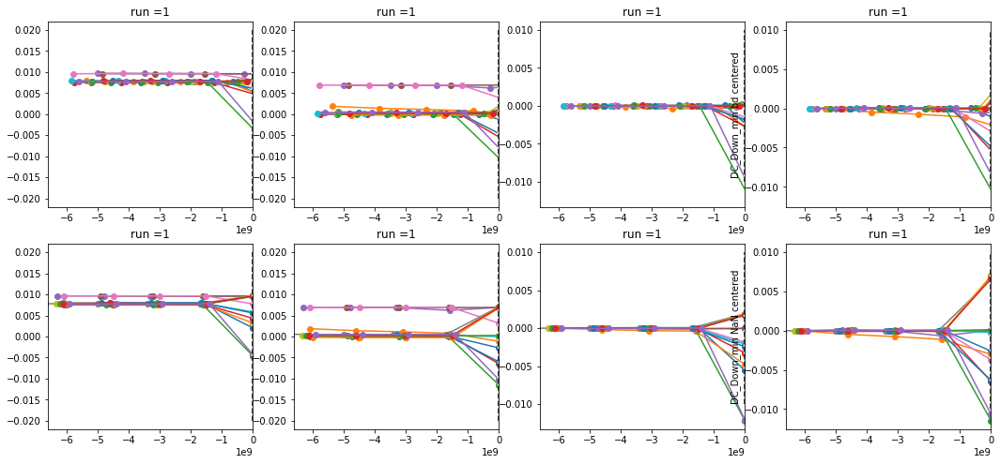

run  2 , # of bd =  118


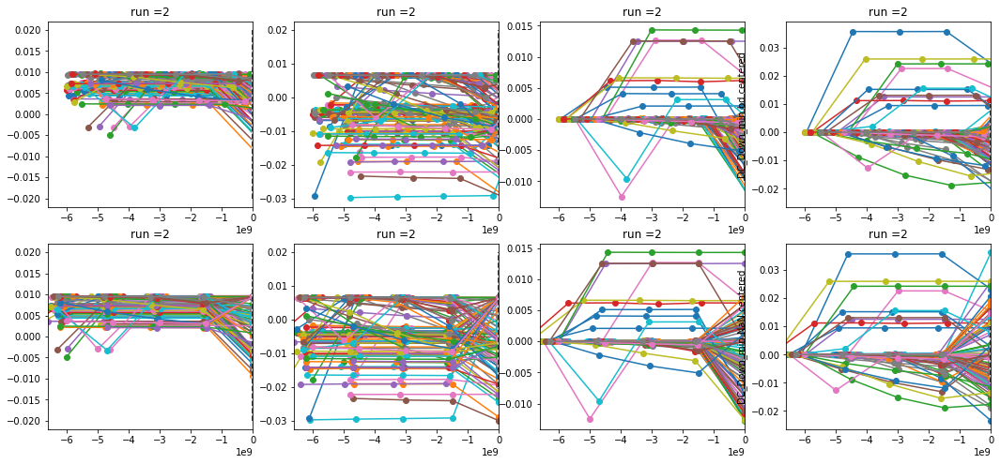

run  3 , # of bd =  80


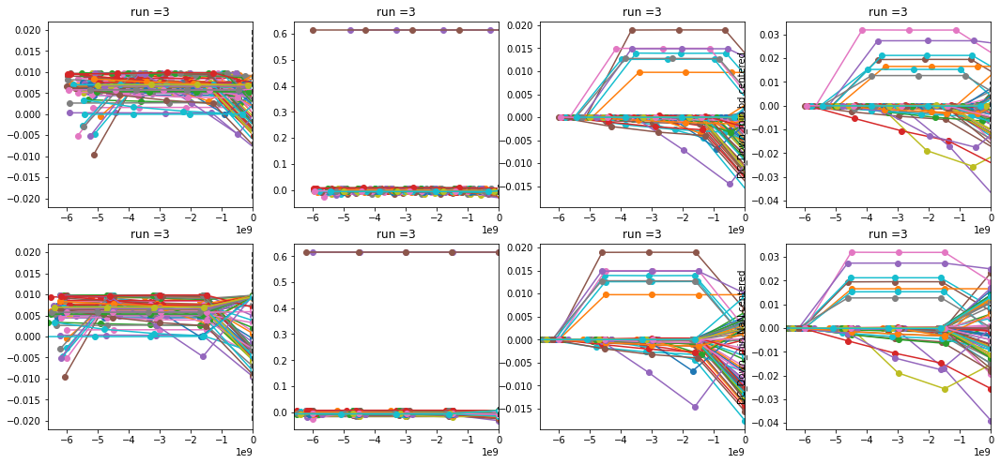

run  4 , # of bd =  31


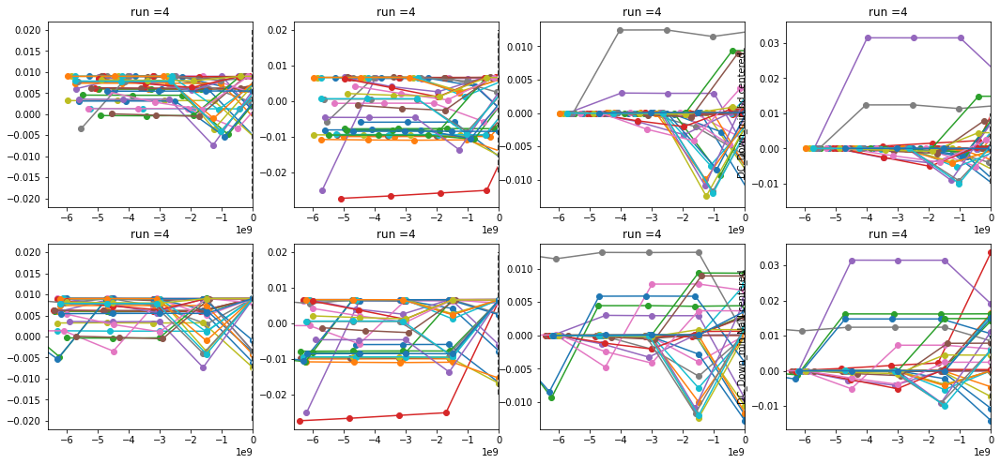

run  5 , # of bd =  127


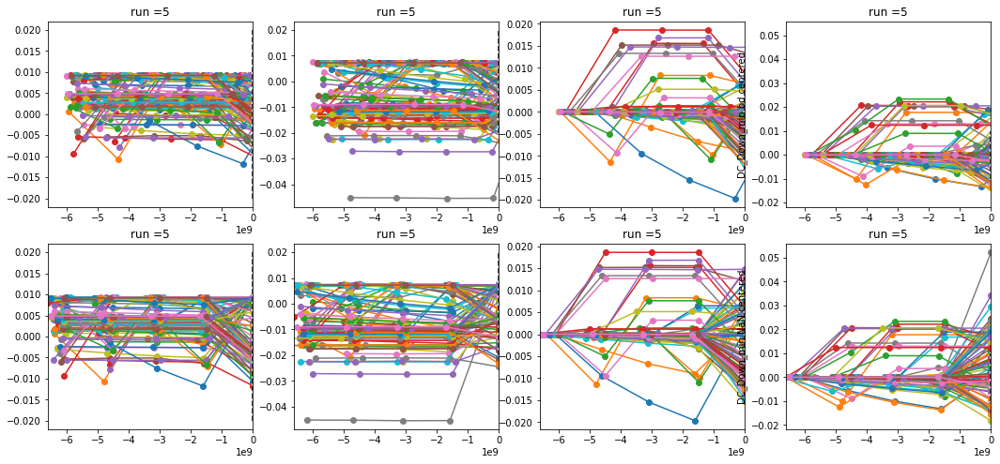

run  6 , # of bd =  88


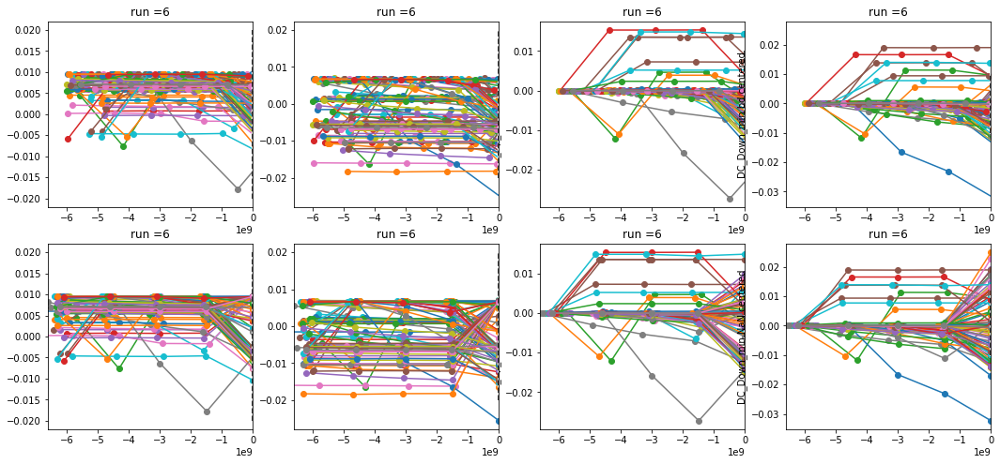

run  7 , # of bd =  41


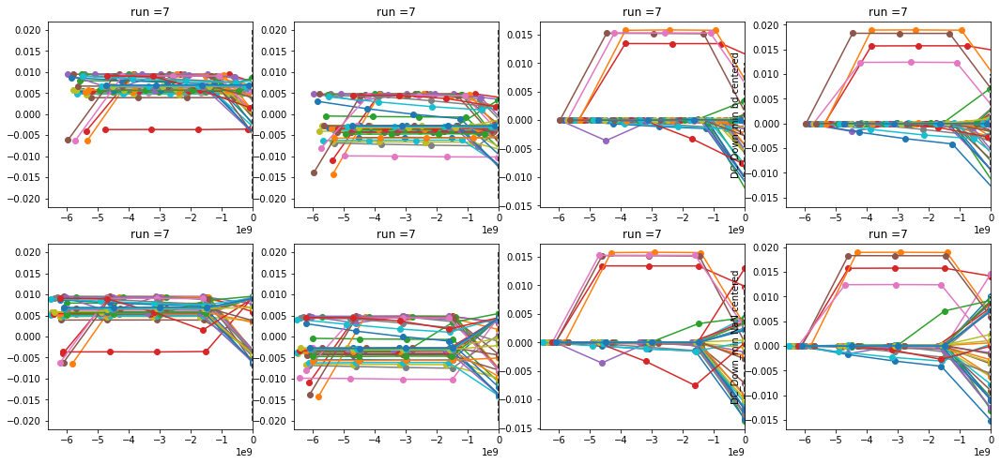

run  8 , # of bd =  24


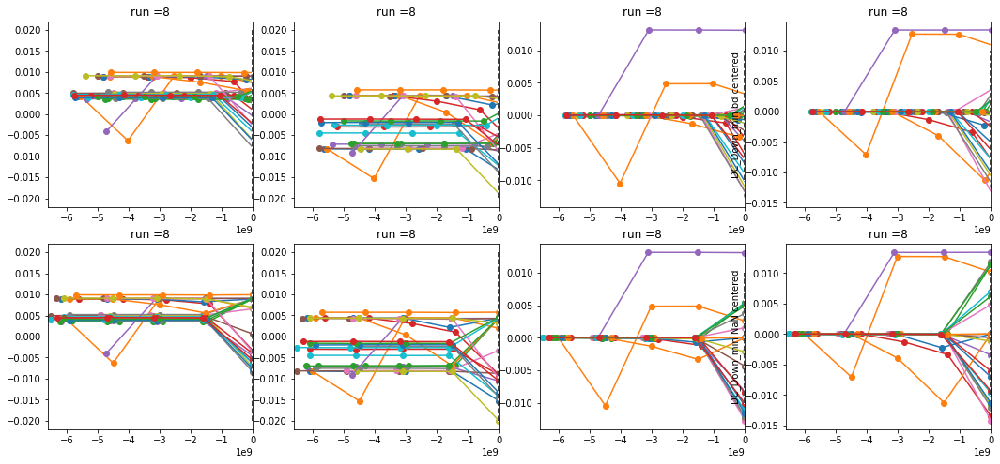

run  9 , # of bd =  12


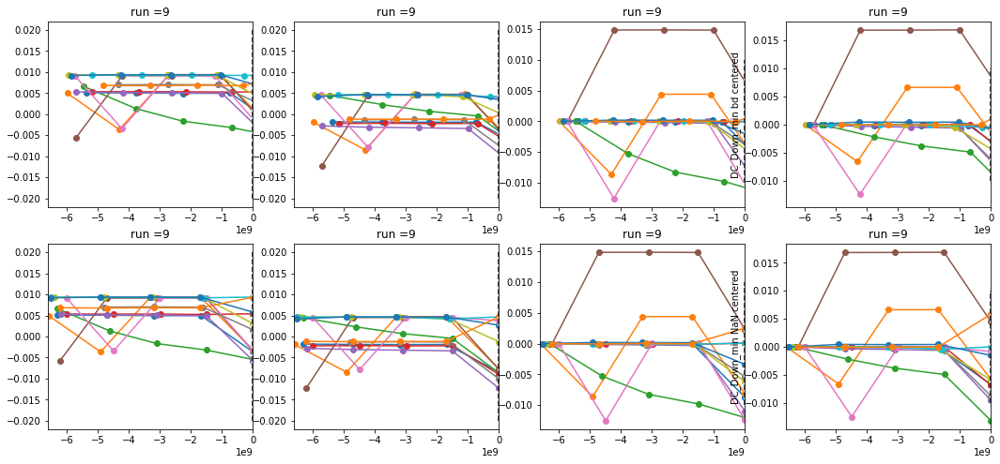

In [42]:
plot_feature_at_bd(6,df_trenddata,df)